In [1]:
import pandas as pd # type:ignore
import numpy as np # type:ignore
import matplotlib.pyplot as plt # type:ignore
import seaborn as sns # type:ignore
from sklearn.datasets import make_blobs # type:ignore
from scipy.stats import multivariate_normal # type:ignore
from sklearn.metrics import confusion_matrix,classification_report # type:ignore
from scipy.optimize import linear_sum_assignment # type:ignore
from matplotlib.lines import Line2D # type:ignore
from sklearn.preprocessing import StandardScaler # type:ignore
from sklearn.decomposition import PCA # type:ignore
from sklearn.manifold import TSNE # type:ignore
import umap # type:ignore
from sklearn.cluster import KMeans,DBSCAN # type:ignore
from sklearn.mixture import GaussianMixture # type:ignore
from sklearn.neighbors import NearestNeighbors # type:ignore
import kmedoids # type:ignore
from pyclustering.cluster.kmedoids import kmedoids # type:ignore
from pyclustering.utils import distance_metric,type_metric # type:ignore
import warnings # type:ignore
warnings.filterwarnings("ignore",category=UserWarning) # type:ignore
from main import CorrelatedClusterGenerator

# data

In [2]:
np.random.seed(42)

In [3]:
cluster_generator = CorrelatedClusterGenerator(n_samples=5000,n_features=20,n_clusters=7,correlation=0.2,random_state=42)

In [4]:
X, y = cluster_generator.generate_clusters()

In [5]:
X = X + np.random.normal(scale=10,size=X.shape) 

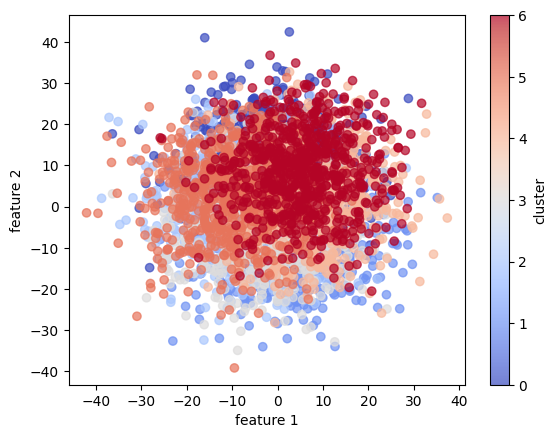

In [6]:
plt.scatter(X[:,0],X[:,1],c=y,cmap='coolwarm',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

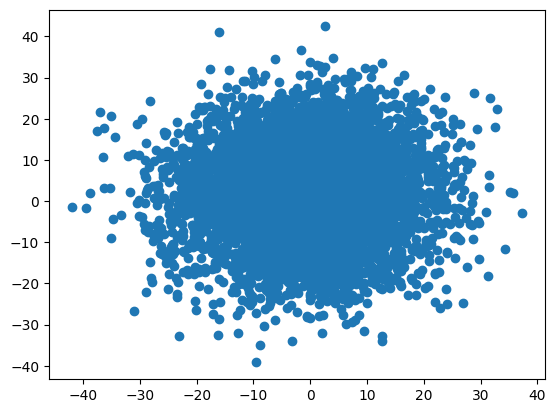

In [7]:
plt.scatter(X[:,0],X[:,1])
plt.show()

In [8]:
corr_dataset = pd.DataFrame(X) 

In [9]:
corr_dataset.columns = [f"vab_{col+1}" for col in corr_dataset.columns]

In [10]:
corr_dataset['target'] = y

In [11]:
corr_dataset

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,0.129782,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,17.132008,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,17.762922,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.121921,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,8.486480,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,8.210666,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,-15.594799,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,2.199879,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-3.604566,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6


In [12]:
# sns.pairplot(corr_dataset)

## correlation matrix

In [13]:
corr_dataset.iloc[:,:-1].corr()

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,vab_11,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20
vab_1,1.000000,0.023073,0.028963,-0.207374,-0.092433,0.004979,0.132677,0.000541,0.060468,0.075522,-0.090371,-0.012122,-0.172597,-0.096899,0.139506,-0.128745,-0.019863,0.103306,-0.093487,0.028691
vab_2,0.023073,1.000000,0.003163,-0.027400,-0.056689,-0.156693,0.079985,0.094240,-0.002386,0.064749,-0.154870,0.112468,0.136856,-0.196019,-0.101527,-0.201971,-0.011462,0.179259,-0.030795,0.100328
vab_3,0.028963,0.003163,1.000000,-0.038331,-0.053628,-0.085899,-0.107971,0.090698,-0.054479,0.208540,-0.071432,0.011579,-0.084457,-0.100850,-0.088029,-0.136116,0.082660,0.027305,0.034415,-0.072648
vab_4,-0.207374,-0.027400,-0.038331,1.000000,0.031805,0.035908,-0.151917,-0.019881,0.005610,-0.052056,0.126500,0.118851,0.163250,0.063193,-0.135207,0.105425,-0.085167,-0.082245,-0.013664,-0.067094
vab_5,-0.092433,-0.056689,-0.053628,0.031805,1.000000,0.024878,-0.008379,0.003163,-0.029947,-0.139939,0.001613,-0.103123,0.058971,0.119054,0.043593,0.138963,0.105471,-0.095528,0.154531,0.039663
vab_6,0.004979,-0.156693,-0.085899,0.035908,0.024878,1.000000,-0.038475,-0.066329,-0.022467,-0.086072,0.166756,-0.097211,-0.119686,0.141165,0.102131,0.138498,-0.048478,-0.118817,-0.014623,-0.015192
vab_7,0.132677,0.079985,-0.107971,-0.151917,-0.008379,-0.038475,1.000000,0.034222,-0.014261,-0.052308,-0.060372,-0.071325,-0.004418,-0.049734,0.115425,-0.044019,0.013594,0.103539,-0.038153,0.127261
vab_8,0.000541,0.094240,0.090698,-0.019881,0.003163,-0.066329,0.034222,1.000000,-0.073627,0.074662,-0.030591,-0.019199,-0.013794,-0.096317,-0.021902,-0.066732,0.052582,0.071663,0.020887,0.036756
vab_9,0.060468,-0.002386,-0.054479,0.005610,-0.029947,-0.022467,-0.014261,-0.073627,1.000000,-0.042231,-0.100262,0.221754,0.154224,-0.031246,-0.074212,-0.018576,-0.137009,0.033230,-0.094833,-0.114136
vab_10,0.075522,0.064749,0.208540,-0.052056,-0.139939,-0.086072,-0.052308,0.074662,-0.042231,1.000000,-0.018663,0.057855,-0.106966,-0.119129,-0.084412,-0.149351,0.066086,0.059937,-0.103161,-0.085136


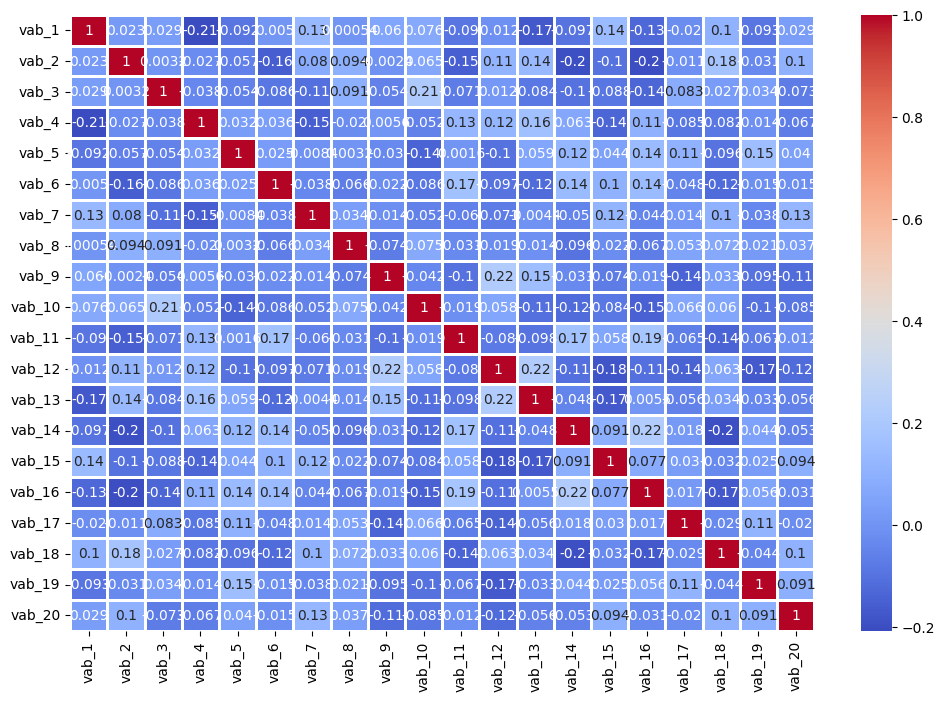

In [14]:
plt.figure(figsize=(12,8))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='coolwarm',annot=True,linewidths=1)
plt.show()

## data standardization

In [15]:
X_values = corr_dataset.iloc[:,:-1].values

In [16]:
y_values = corr_dataset.iloc[:,-1].values

In [17]:
scaler = StandardScaler()

In [18]:
X_values = scaler.fit_transform(X_values)

In [19]:
np.mean(X_values),np.std(X_values)

(1.1131551862748267e-16, 1.0)

In [20]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,1.153656,0.870824,0.221257,1.475999,0.035855,-0.081405,0.534178,-0.062254,0.834383,0.082458,-0.760570,0.066128,0.736022,-0.102728,-1.058131,-0.440906,-2.479891,0.706789,-1.101894,0.635118
1,0.510448,-0.254278,0.044005,1.438156,0.762526,-0.177800,-1.067850,-1.471525,0.810779,-0.239185,-0.169026,1.483742,0.248438,-0.620831,0.220515,-0.949241,-1.003807,0.901335,-0.163610,-0.103161
2,0.682622,-0.337852,1.021674,-0.308206,-0.784226,-0.467547,-0.700280,-1.312575,1.567671,1.398035,-0.968826,1.536347,0.030483,-1.642843,-0.793488,-1.716989,0.119779,-0.270681,-1.364608,-3.357325
3,-0.241609,0.797552,1.712838,-1.123679,0.444753,-0.911554,-0.510314,0.405042,0.168621,-1.153967,-0.121406,1.482901,1.298591,-0.278027,-0.944477,-1.949542,0.182114,0.368893,0.181876,0.132293
4,-0.106714,0.243580,-0.313187,0.340450,1.005064,-1.557969,0.305812,1.078840,-1.234551,0.934992,-0.769005,0.762894,2.022752,0.078573,-1.723599,-0.190747,-1.203594,-0.369451,0.169431,0.886872
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,0.202153,-0.329386,0.599067,1.345982,1.215027,0.407616,0.786394,0.562067,0.618826,0.805812,-0.228068,0.739897,-0.941528,0.510959,-0.578604,0.017515,0.096159,2.764704,-0.479218,0.307274
4994,0.095544,0.970232,-0.503740,-1.215373,-0.906807,-0.344564,0.864037,0.083356,-0.428848,-0.171209,0.828990,-1.244959,0.466922,0.190773,0.060473,-0.558214,-0.551085,0.888696,-0.169328,0.972426
4995,-0.162300,1.465589,1.708017,-1.385960,-0.188701,-0.303549,0.090599,-0.677200,-0.526152,0.962107,-0.498803,0.238729,1.068230,0.962505,0.112960,0.885552,-1.089700,0.568123,-0.389874,0.287317
4996,1.393835,1.610606,0.326453,-1.283345,1.891436,1.736783,0.895849,0.623718,0.391884,-0.446807,1.016009,-0.245235,-1.447877,-1.832757,0.806964,-1.491595,0.564467,1.786941,0.195616,-0.619635


<Axes: ylabel='Density'>

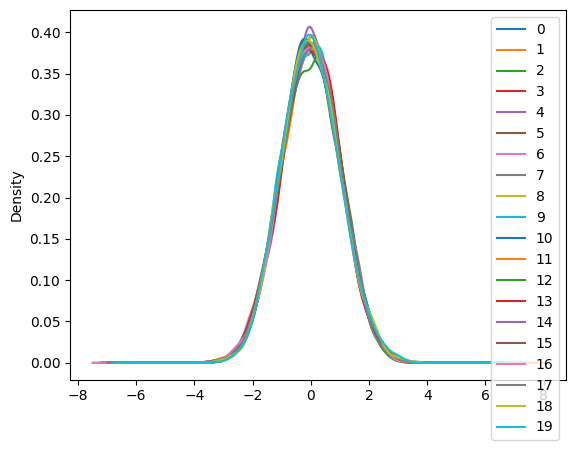

In [21]:
pd.DataFrame(X_values).plot(kind='density')

## pca 

In [22]:
pca_general = PCA()

In [23]:
pca_general.fit(X_values)

PCA()

In [24]:
explained_variance = pca_general.explained_variance_ratio_

In [25]:
explained_variance

array([0.11277828, 0.0925091 , 0.07349575, 0.07284998, 0.05784737,
       0.04912204, 0.04626087, 0.04226325, 0.04144218, 0.04121452,
       0.04001427, 0.03925765, 0.03874361, 0.03765662, 0.03749401,
       0.03715568, 0.03616957, 0.03582266, 0.03478882, 0.03311376])

In [26]:
eigenvalues = pca_general.explained_variance_

In [27]:
pd.DataFrame(eigenvalues)

,0
0,2.256017
1,1.850552
2,1.470209
3,1.457291
4,1.157179
5,0.982637
6,0.925402
7,0.845434
8,0.829009
9,0.824455


In [28]:
eigenvectors = pca_general.components_

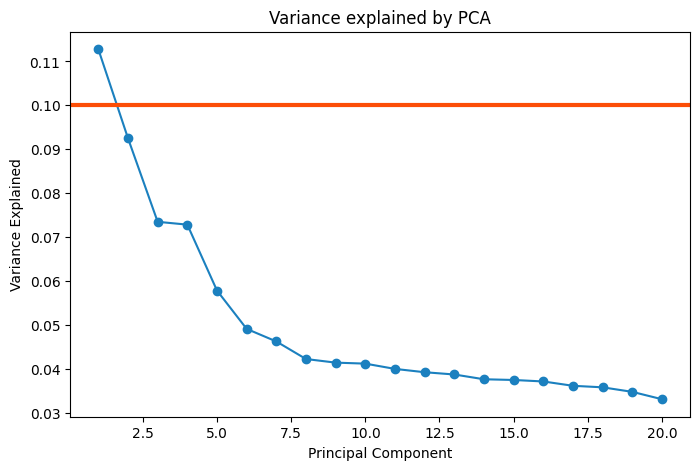

In [29]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [30]:
pca = PCA(n_components=2)

In [31]:
principal_components = pca.fit_transform(X_values)

In [32]:
pd.DataFrame(principal_components).head(8)

,0,1
0,-1.733774,1.337934
1,-0.853585,1.727825
2,-2.939074,1.864656
3,-2.248505,0.774680
4,-1.367328,1.269478
5,-1.307737,0.130426
6,-2.080596,2.155277
7,0.280466,2.511418


In [33]:
principal_df = pd.DataFrame(data = principal_components,columns = ['principal component 1','principal component 2'])

In [34]:
final_df = pd.concat([principal_df,corr_dataset[['target']]],axis = 1)

In [35]:
final_df

,principal component 1,principal component 2,target
0,-1.733774,1.337934,0
1,-0.853585,1.727825,0
2,-2.939074,1.864656,0
3,-2.248505,0.774680,0
4,-1.367328,1.269478,0
...,...,...,...
4993,-0.876961,0.032419,6
4994,-0.633313,-1.314032,6
4995,-0.995552,-0.037526,6
4996,-1.240399,-2.492508,6


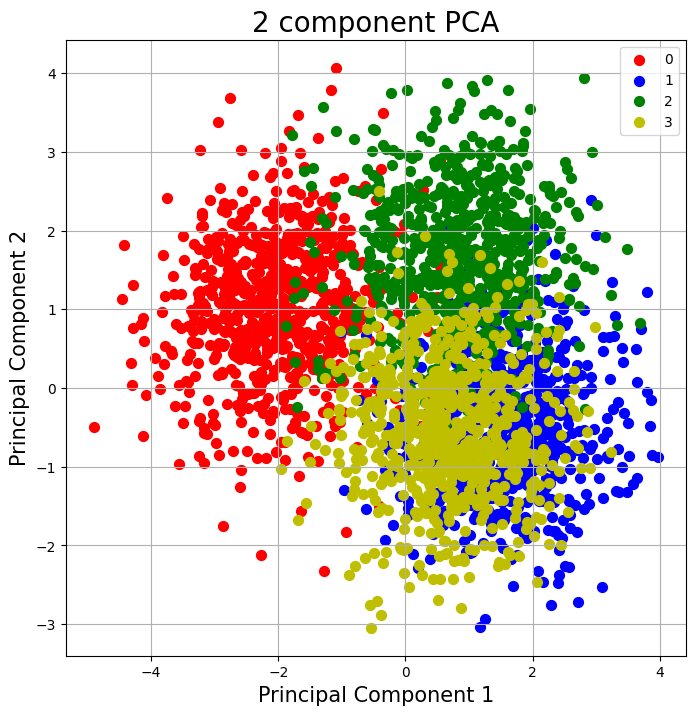

In [36]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

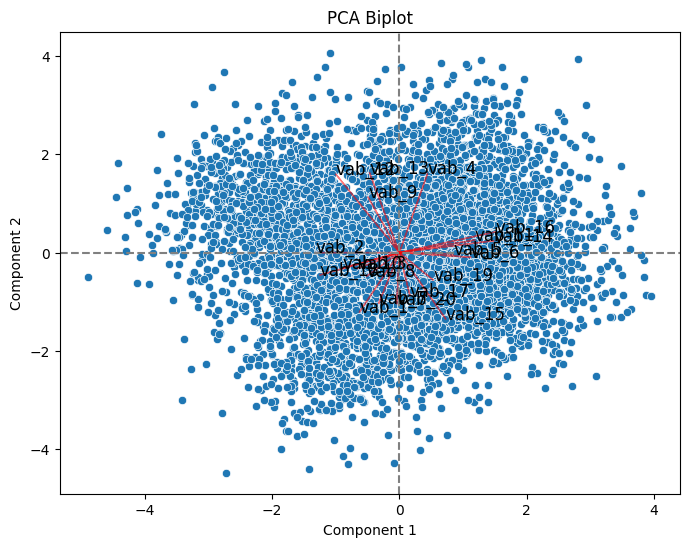

In [37]:
scores = pca.transform(X_values)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=scores[:, 0], y=scores[:, 1])
for i, col in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.arrow(0, 0, eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), color='r', alpha=0.5)
    plt.text(eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), col, fontsize=12)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA Biplot')
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.show()

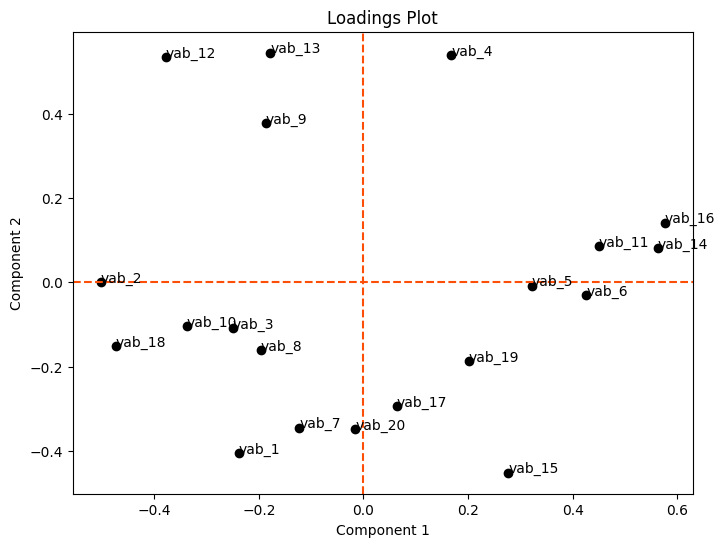

In [38]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
plt.figure(figsize=(8, 6))
plt.scatter(loadings[:, 0], loadings[:, 1], color='black')
for i, txt in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.text(loadings[i, 0], loadings[i, 1], txt, fontsize=10)
plt.axhline(0, color='#FC4E07', linestyle='--')
plt.axvline(0, color='#FC4E07', linestyle='--')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Loadings Plot')
plt.show()

In [39]:
X_pca = pca.transform(X_values)

In [40]:
pd.DataFrame(X_pca).head()

,0,1
0,-1.733774,1.337934
1,-0.853585,1.727825
2,-2.939074,1.864656
3,-2.248505,0.774680
4,-1.367328,1.269478


## t-SNE

In [41]:
tsne = TSNE(n_components=2,random_state=42)

In [42]:
X_tsne = tsne.fit_transform(X_values)

In [43]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2')),corr_dataset['target']],axis=1)

In [44]:
tsne_data

,dim_1,dim_2,target
0,-34.261471,22.498367,0
1,-39.988045,-5.609701,0
2,-37.886765,-8.760159,0
3,-39.913979,27.525530,0
4,-59.231037,-8.575853,0
...,...,...,...
4993,-8.277605,4.287300,6
4994,-8.632794,36.415512,6
4995,-24.660011,13.155287,6
4996,-9.923753,31.128511,6


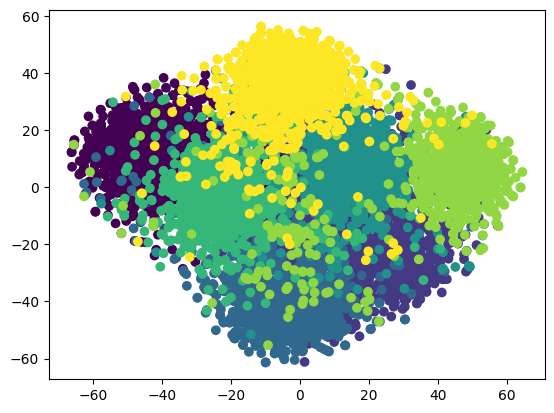

In [45]:
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'])
plt.show()

In [46]:
tsne.kl_divergence_

3.032562494277954

## umap

In [47]:
umap = umap.UMAP(random_state=42)

In [48]:
X_umap = umap.fit_transform(X_values)

In [49]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2')),corr_dataset['target']],axis=1)

In [50]:
umap_data

,dim_1,dim_2,target
0,3.910630,0.531054,0
1,4.285501,0.632032,0
2,2.775277,1.221116,0
3,2.662615,0.474868,0
4,3.459848,-0.071094,0
...,...,...,...
4993,4.713073,1.288223,6
4994,4.768109,4.077216,6
4995,4.774559,1.312728,6
4996,5.044168,3.459125,6


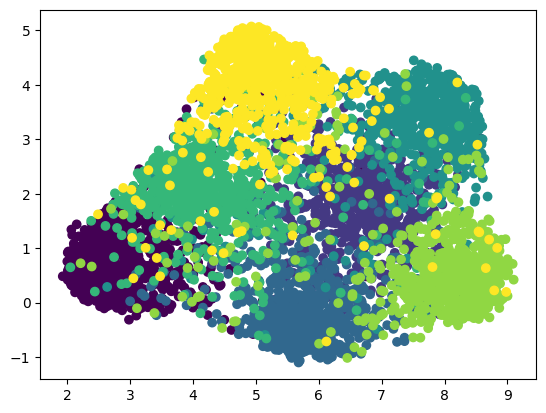

In [51]:
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'])
plt.show()

## k-means 

In [52]:
kmeans = KMeans(n_clusters=7,init='k-means++',random_state=42)

In [53]:
kmeans.fit(X_values)

KMeans(n_clusters=7, random_state=42)

In [54]:
df_kmeans = corr_dataset.copy()

In [55]:
df_kmeans['k_means'] = kmeans.labels_

In [56]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,2
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,2
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,2
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,2
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,4
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,1
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,4
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,1


In [57]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.132452981192477
accuracy after: 0.8553421368547419


In [58]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,0
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,0
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,0
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,0
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,4
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,6
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,4
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,6


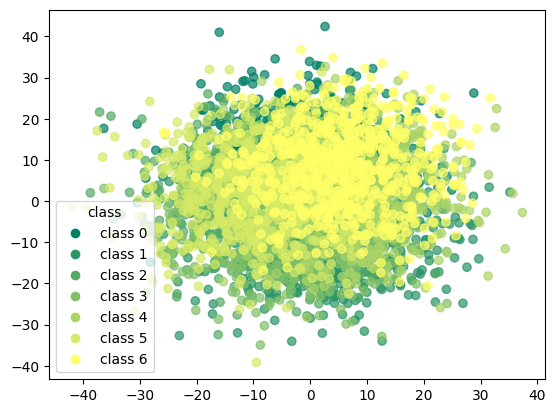

In [59]:
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

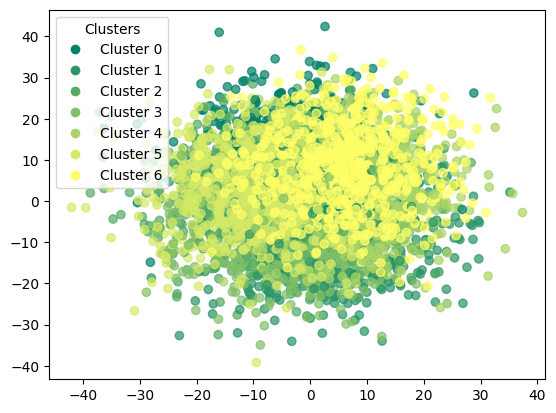

In [60]:
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [61]:
kmeans.cluster_centers_

array([[-0.58203108, -0.14424111, -0.72319888,  0.89829746, -0.13924074,
         0.41403395, -0.15275337, -0.36312825,  0.22487819, -0.41548421,
         0.85598978,  0.53461944,  0.62903675,  0.46126733, -0.2459327 ,
         0.57375278, -0.72085696, -0.28224781, -0.5713291 , -0.12697515],
       [ 0.57422075,  0.57775106, -0.17361053, -0.54997001, -0.29122141,
        -0.05509321,  0.7647321 ,  0.33088743, -0.67150973,  0.14691764,
        -0.06556682, -0.4806663 , -0.59067908, -0.564276  ,  0.53896136,
        -0.52164133,  0.06784395,  0.66627802, -0.05906686,  1.05369168],
       [-0.12968618,  0.67816378,  0.61823203,  0.35140371, -0.41522849,
        -0.59232544, -0.52466399,  0.25376808,  0.37238784,  0.50985231,
        -0.67662229,  0.85908822,  0.49946775, -0.79872137, -0.90203686,
        -0.80374297, -0.34315849,  0.46443517, -0.00939274, -0.17248085],
       [-0.81941915,  0.10099443, -0.12622969,  0.16927842,  0.98472481,
        -0.37454257,  0.09166212,  0.11068321, -

In [62]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[647   3   7  13  26   7  11]
 [  1 555  43  47  23  25  20]
 [ 17  21 626   7  23  18   2]
 [  8  42   6 625  11   8  14]
 [ 42  19  17  15 577   6  38]
 [ 11  19  28  19  13 609  15]
 [ 11  16   3  14  24  10 636]]


In [63]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.88      0.91      0.89       714
           1       0.82      0.78      0.80       714
           2       0.86      0.88      0.87       714
           3       0.84      0.88      0.86       714
           4       0.83      0.81      0.82       714
           5       0.89      0.85      0.87       714
           6       0.86      0.89      0.88       714

    accuracy                           0.86      4998
   macro avg       0.86      0.86      0.85      4998
weighted avg       0.86      0.86      0.85      4998



### k-means with pca

In [64]:
kmeans_pca = KMeans(n_clusters=7,init='k-means++',random_state=42)

In [65]:
kmeans_pca.fit(X_pca)

KMeans(n_clusters=7, random_state=42)

In [66]:
df_pca_kmeans = corr_dataset.copy()

In [67]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [68]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,2
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,2
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,2
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,2
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,4
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,1
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,4
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,1


In [69]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.13945578231292516
accuracy after: 0.51640656262505


In [70]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,0
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,0
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,0
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,0
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,4
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,6
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,4
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,6


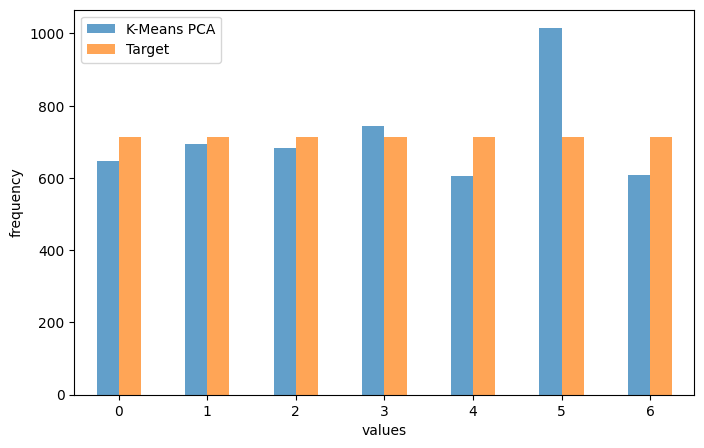

In [71]:
counts_kmeans = df_pca_kmeans['kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [72]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[505   0  19   0 155  30   5]
 [  1 281  25 275   0 120  12]
 [ 21 101 515   2   7  68   0]
 [  1  96  21 266  28 258  44]
 [115  11  20  16 280 213  59]
 [  3 206  82 126  18 263  16]
 [  2   0   0  60 118  63 471]]


In [73]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.78      0.71      0.74       714
           1       0.40      0.39      0.40       714
           2       0.76      0.72      0.74       714
           3       0.36      0.37      0.36       714
           4       0.46      0.39      0.42       714
           5       0.26      0.37      0.30       714
           6       0.78      0.66      0.71       714

    accuracy                           0.52      4998
   macro avg       0.54      0.52      0.53      4998
weighted avg       0.54      0.52      0.53      4998



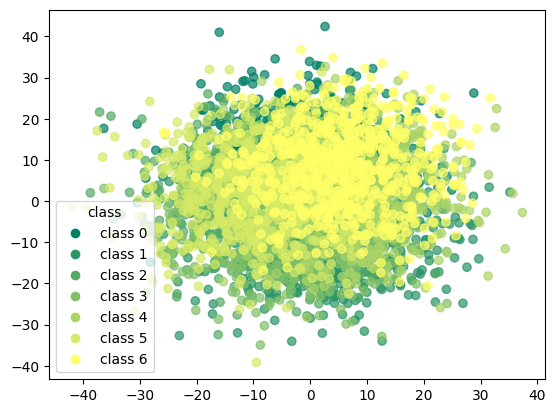

In [74]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

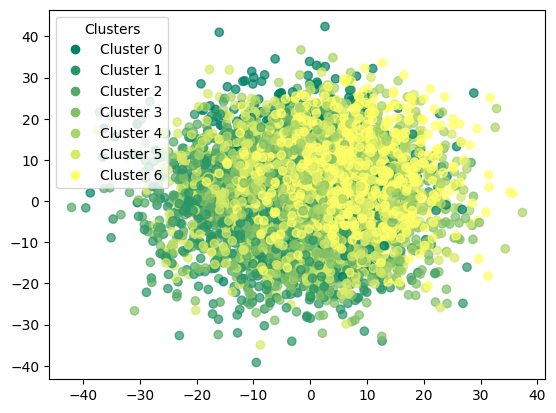

In [75]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

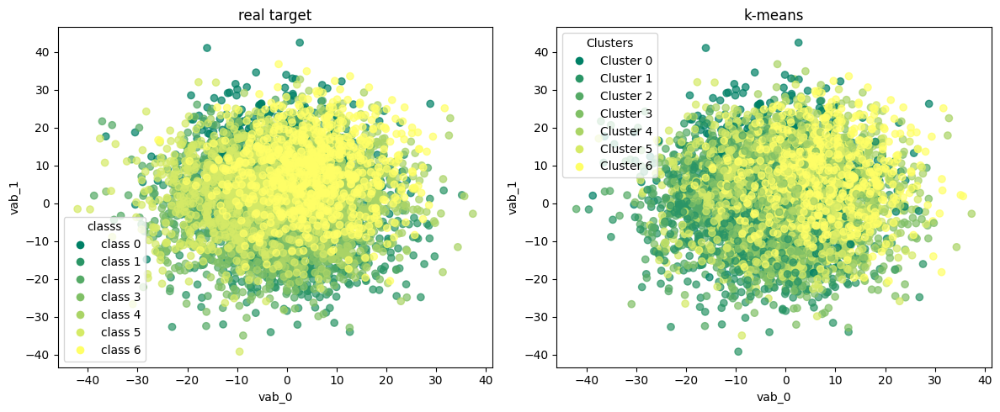

In [76]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

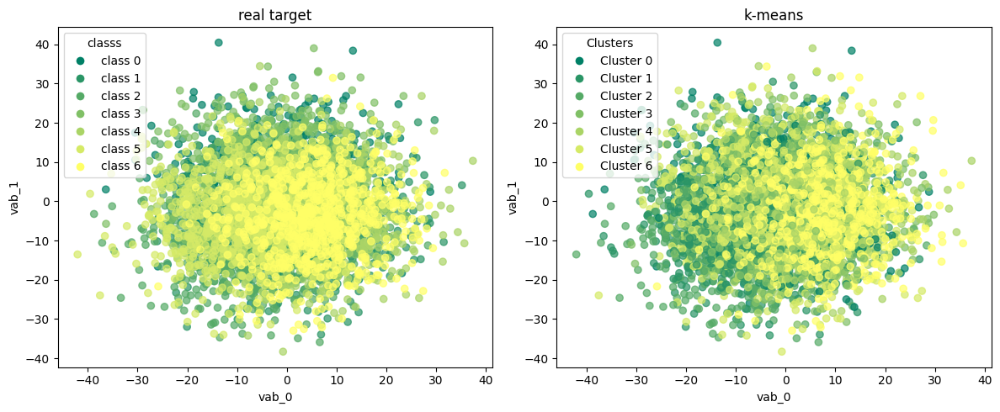

In [77]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

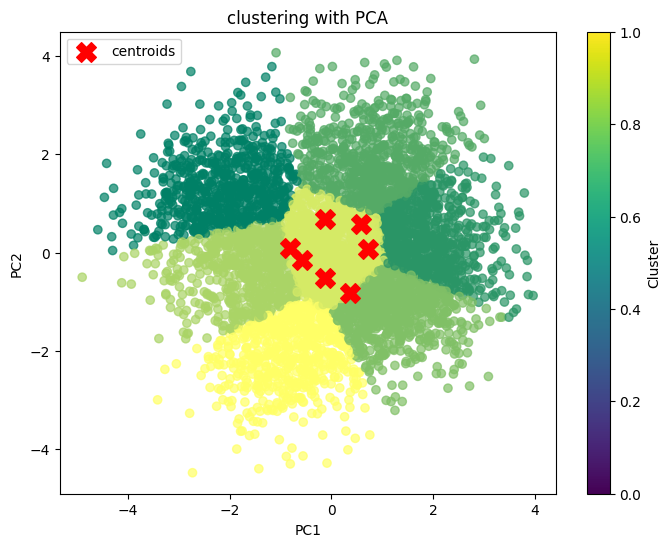

In [78]:
plt.figure(figsize=(8, 6))
plt.scatter(final_df['principal component 1'], final_df['principal component 2'] , c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', marker='X', s=200, label='centroids')

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('clustering with PCA')
plt.colorbar(label='Cluster')
plt.legend()
plt.show()

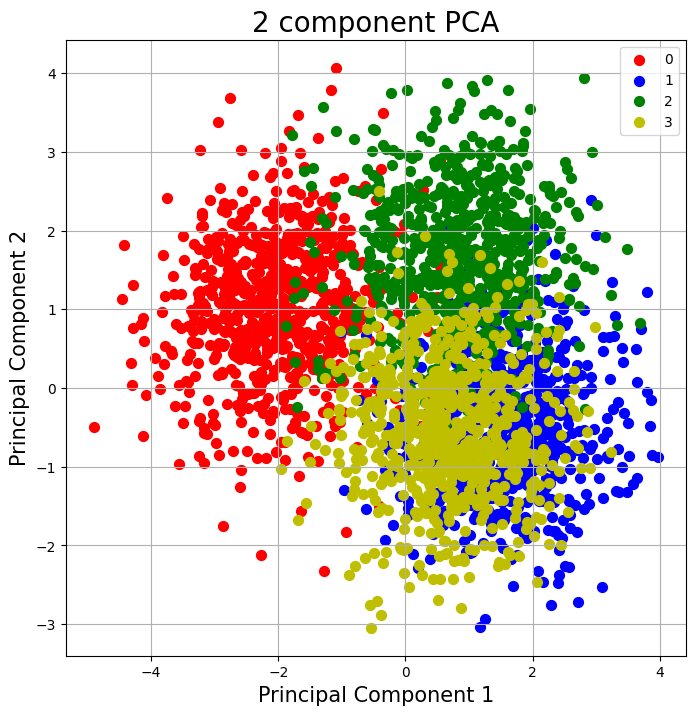

In [79]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### k-means with t-SNE

In [80]:
kmeans_tsne = KMeans(n_clusters=7,init='k-means++',random_state=42)

In [81]:
kmeans_tsne.fit(X_tsne)

KMeans(n_clusters=7, random_state=42)

In [82]:
df_tsne_kmeans = corr_dataset.copy()

In [83]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [84]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,2
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,5
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,5
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,2
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,5
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,1
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,2
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,1


In [85]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.027611044417767107
accuracy after: 0.7737094837935174


In [86]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,0
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,4
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,4
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,0
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,4
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,6
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,0
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,6


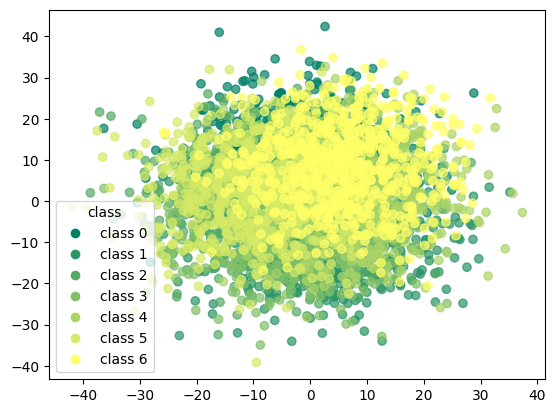

In [87]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

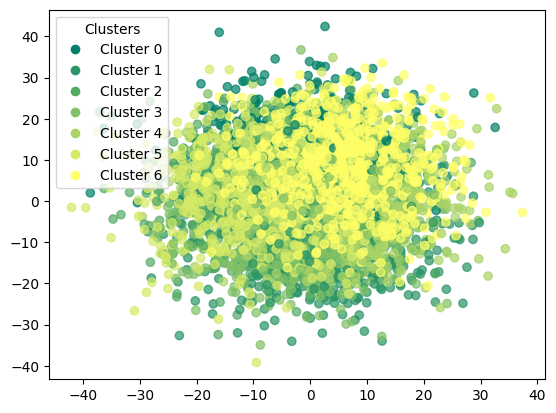

In [88]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

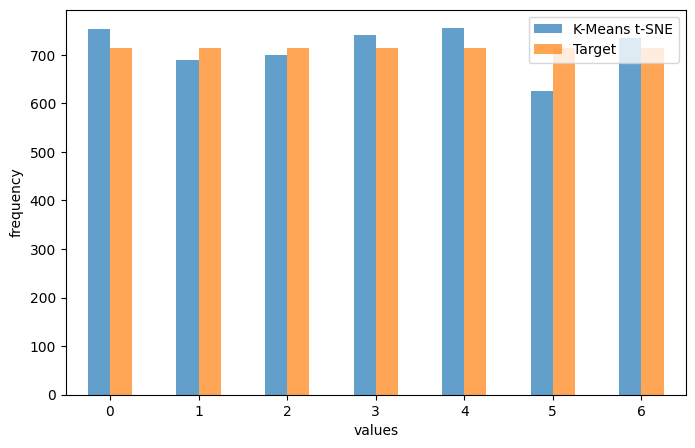

In [89]:
counts_kmeans = df_tsne_kmeans['kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [90]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[621   8  10  13  41   2  19]
 [  0 489  46  61  53  44  21]
 [ 18  58 569   7  52   7   3]
 [  7  76  12 551  25  28  15]
 [ 80  18  26  21 509   1  59]
 [ 10  34  36  40  41 532  21]
 [ 18   7   1  47  34  11 596]]


In [91]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.82      0.87      0.85       714
           1       0.71      0.68      0.70       714
           2       0.81      0.80      0.80       714
           3       0.74      0.77      0.76       714
           4       0.67      0.71      0.69       714
           5       0.85      0.75      0.79       714
           6       0.81      0.83      0.82       714

    accuracy                           0.77      4998
   macro avg       0.78      0.77      0.77      4998
weighted avg       0.78      0.77      0.77      4998



### k-means with umap

In [92]:
kmeans_umap = KMeans(n_clusters=7,init='k-means++',random_state=42)

In [93]:
kmeans_umap.fit(X_umap)

KMeans(n_clusters=7, random_state=42)

In [94]:
df_umap_kmeans = corr_dataset.copy()

In [95]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [96]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,2
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,2
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,2
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,2
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,6
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,4
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,6
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,4


In [97]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.3629451780712285
accuracy after: 0.8087234893957583


In [98]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,0
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,0
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,0
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,0
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,4
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,6
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,4
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,6


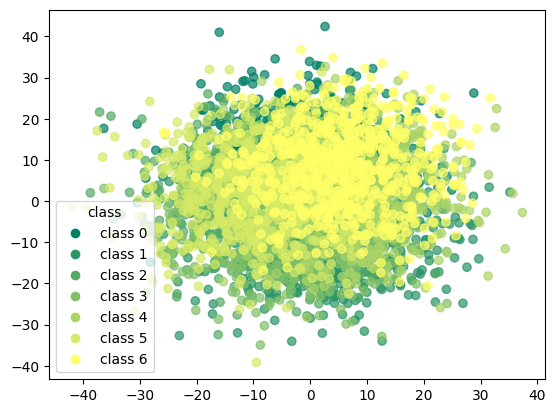

In [99]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

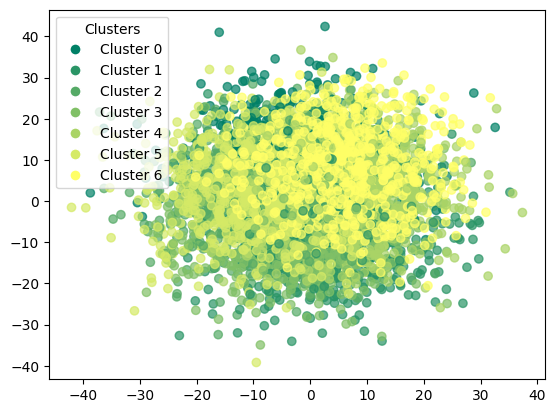

In [100]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

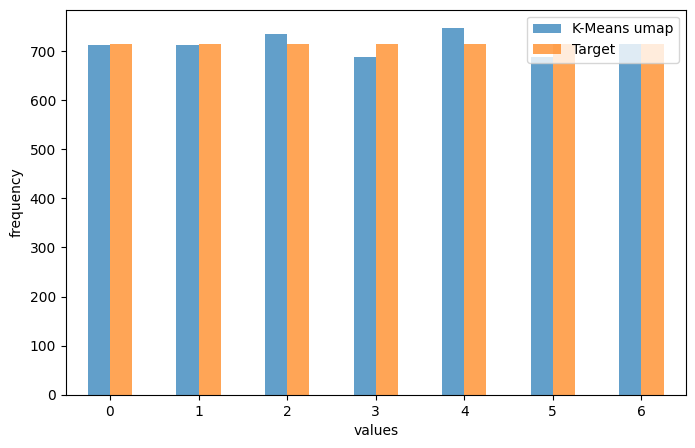

In [101]:
counts_kmeans = df_umap_kmeans['kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [102]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[617   5  14   8  49   7  14]
 [  0 522  49  49  26  47  21]
 [ 19  28 598   7  33  24   5]
 [  5  63  12 581  19  11  23]
 [ 47  35  26   9 549   8  40]
 [ 17  27  34  17  16 583  20]
 [  7  32   1  18  55   9 592]]


In [103]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.87      0.86      0.87       714
           1       0.73      0.73      0.73       714
           2       0.81      0.84      0.83       714
           3       0.84      0.81      0.83       714
           4       0.73      0.77      0.75       714
           5       0.85      0.82      0.83       714
           6       0.83      0.83      0.83       714

    accuracy                           0.81      4998
   macro avg       0.81      0.81      0.81      4998
weighted avg       0.81      0.81      0.81      4998



## trimmed k-means

In [104]:
def trimmed_clustering(X,n_clusters,trim_fraction=0.1):

    kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(X)
    distances = np.min(kmeans.transform(X),axis=1)
    
    trim_threshold = np.percentile(distances,100 * (1 - trim_fraction))
    trimmed_X = X[distances < trim_threshold]
    trimmed_indices = np.where(distances < trim_threshold)[0]
    trimmed_kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(trimmed_X)
    
    return trimmed_kmeans,trimmed_indices

In [105]:
trimmed_kmeans,trimmmed_indces = trimmed_clustering(X_values,n_clusters=7,trim_fraction=0.1)

In [106]:
trimmed_kmeans

KMeans(n_clusters=7, random_state=42)

In [107]:
df_trim_kmeans = corr_dataset.copy()

In [108]:
df_trim_kmeans = df_trim_kmeans.iloc[trimmmed_indces]  

In [109]:
df_trim_kmeans['trim_kmeans'] = trimmed_kmeans.labels_

In [110]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,4
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,4
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,4
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,4
5,-15.029245,4.896747,15.927018,-6.535717,-6.186367,-10.242324,4.159714,10.748647,-0.129886,-3.518675,...,4.037115,-0.801177,2.826198,-20.444492,-4.108956,-8.951271,-4.591017,9.182273,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,1
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,3
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,1
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,3


In [111]:
y_true = df_trim_kmeans['target'].values  
y_kmeans = df_trim_kmeans['trim_kmeans'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_trim_kmeans['trim_kmeans'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_trim_kmeans['trim_kmeans'] == y_true))

accuracy before: 0.028012449977767896
accuracy after: 0.8628279235215651


In [112]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,0
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,0
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,0
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,0
5,-15.029245,4.896747,15.927018,-6.535717,-6.186367,-10.242324,4.159714,10.748647,-0.129886,-3.518675,...,4.037115,-0.801177,2.826198,-20.444492,-4.108956,-8.951271,-4.591017,9.182273,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,4
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,6
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,4
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,6


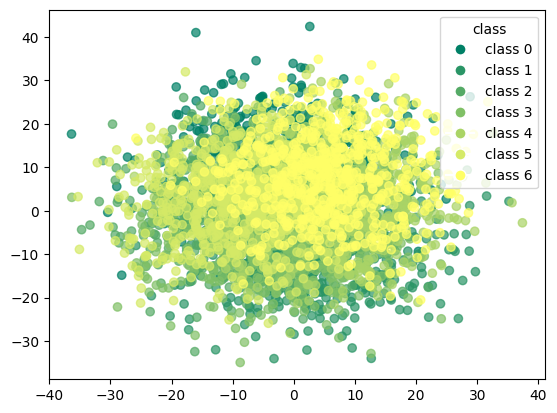

In [113]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

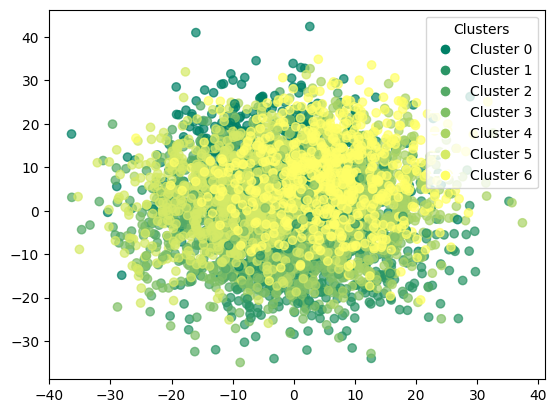

In [114]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['trim_kmeans'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_trim_kmeans['trim_kmeans'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [115]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[592   4   6   9  19   3   9]
 [  1 508  34  30  19  22  18]
 [ 14  21 565   4  22  19   2]
 [  7  47   5 572   7   7  12]
 [ 38  15  12  13 523   5  34]
 [  8  17  22  16  11 552  14]
 [  9  15   1  15  23   8 569]]


In [116]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       0.88      0.92      0.90       642
           1       0.81      0.80      0.81       632
           2       0.88      0.87      0.87       647
           3       0.87      0.87      0.87       657
           4       0.84      0.82      0.83       640
           5       0.90      0.86      0.88       640
           6       0.86      0.89      0.88       640

    accuracy                           0.86      4498
   macro avg       0.86      0.86      0.86      4498
weighted avg       0.86      0.86      0.86      4498



### trimmed k-means with pca

In [117]:
trim_kmeans_pca,trimmmed_indices = trimmed_clustering(X_pca,n_clusters=7,trim_fraction=0.1)

In [118]:
trim_kmeans_pca

KMeans(n_clusters=7, random_state=42)

In [119]:
df_pca_trim_kmeans = corr_dataset.copy()

In [120]:
df_pca_trim_kmeans = df_pca_trim_kmeans.iloc[trimmmed_indces]  

In [121]:
df_pca_trim_kmeans["trim_kmeans_pca"] = trim_kmeans_pca.labels_

In [122]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,4
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,4
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,4
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,4
5,-15.029245,4.896747,15.927018,-6.535717,-6.186367,-10.242324,4.159714,10.748647,-0.129886,-3.518675,...,4.037115,-0.801177,2.826198,-20.444492,-4.108956,-8.951271,-4.591017,9.182273,0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,1
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,6
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,1
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,6


In [123]:
y_true = df_pca_trim_kmeans['target'].values  
y_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_trim_kmeans['trim_kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_trim_kmeans['trim_kmeans_pca'] == y_true))

accuracy before: 0.13561582925744775
accuracy after: 0.4977767896843041


In [124]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,0
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,0
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,0
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,0
5,-15.029245,4.896747,15.927018,-6.535717,-6.186367,-10.242324,4.159714,10.748647,-0.129886,-3.518675,...,4.037115,-0.801177,2.826198,-20.444492,-4.108956,-8.951271,-4.591017,9.182273,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,6
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,4
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,6
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,4


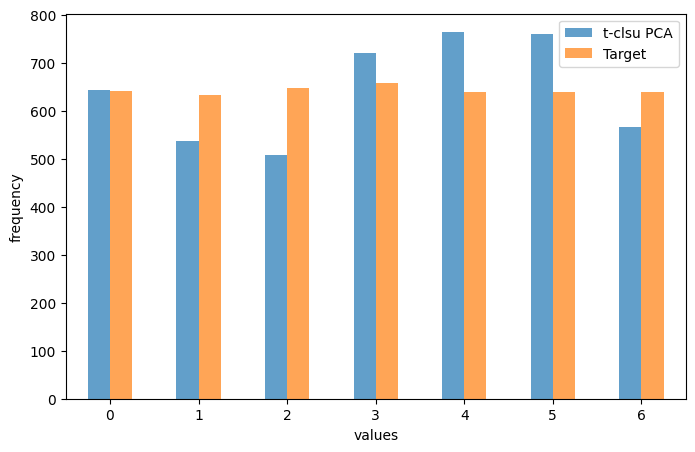

In [125]:
counts_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'t-clust PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["t-clsu PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [126]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[466  24  13  20  88  16  15]
 [  0 250  50 138  20 170   4]
 [ 12  27 359  43  51 145  10]
 [ 18 104  12 219 137 133  34]
 [138   6  15  53 298  46  84]
 [  3 118  56 114 100 238  11]
 [  7   7   2 134  70  11 409]]


In [127]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.72      0.73      0.72       642
           1       0.47      0.40      0.43       632
           2       0.71      0.55      0.62       647
           3       0.30      0.33      0.32       657
           4       0.39      0.47      0.42       640
           5       0.31      0.37      0.34       640
           6       0.72      0.64      0.68       640

    accuracy                           0.50      4498
   macro avg       0.52      0.50      0.51      4498
weighted avg       0.52      0.50      0.50      4498



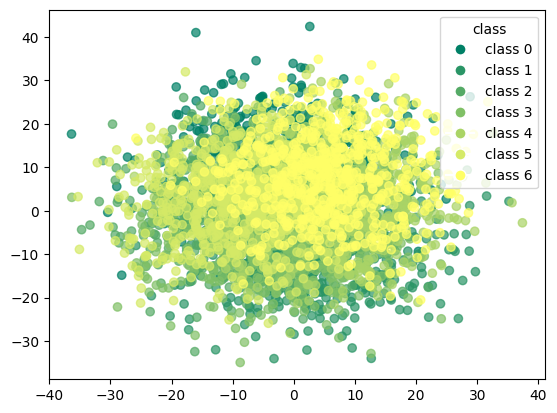

In [128]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

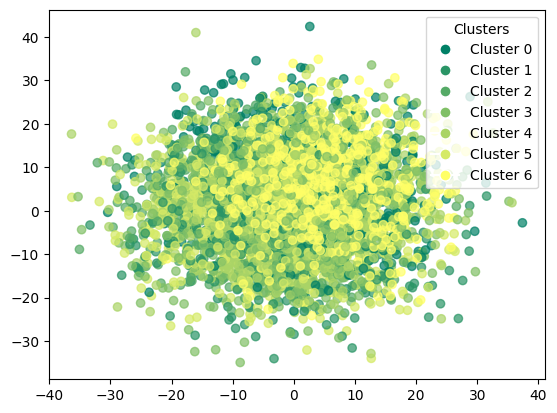

In [129]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

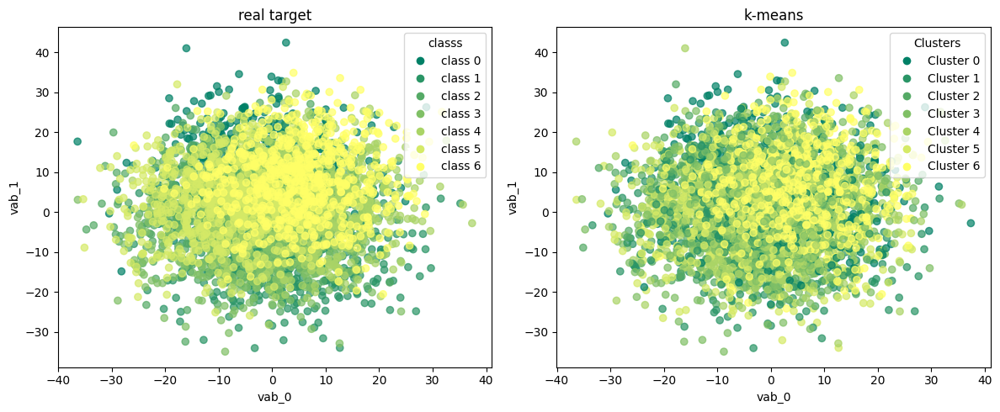

In [130]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

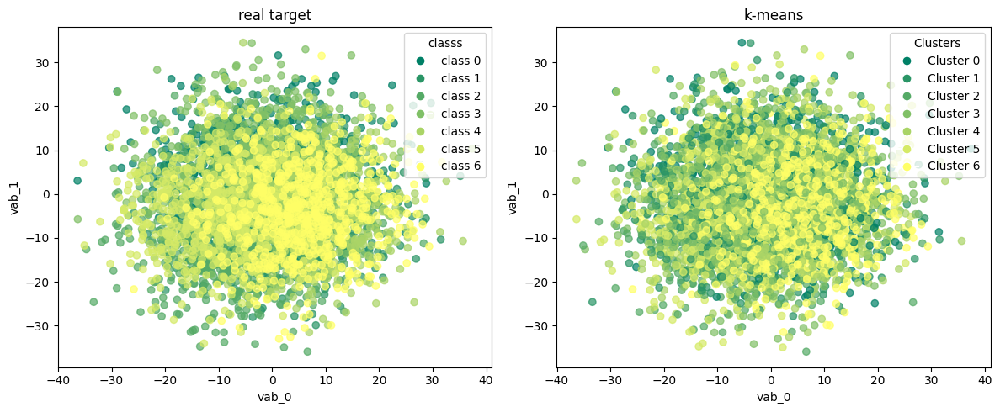

In [131]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

### trimmed k-means with t-SNE

In [132]:
trim_kmeans_tsne,trimmmed_indices = trimmed_clustering(X_tsne,n_clusters=7,trim_fraction=0.1)

In [133]:
trim_kmeans_tsne

KMeans(n_clusters=7, random_state=42)

In [134]:
df_tsne_trim_kmeans = corr_dataset.copy()

In [135]:
df_tsne_trim_kmeans = df_tsne_trim_kmeans.iloc[trimmmed_indces]  

In [136]:
df_tsne_trim_kmeans['trim_kmeans_tsne'] = trim_kmeans_tsne.labels_

In [137]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,5
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,5
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,1
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,5
5,-15.029245,4.896747,15.927018,-6.535717,-6.186367,-10.242324,4.159714,10.748647,-0.129886,-3.518675,...,4.037115,-0.801177,2.826198,-20.444492,-4.108956,-8.951271,-4.591017,9.182273,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,4
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,4
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,1
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,4


In [138]:
y_true = df_tsne_trim_kmeans['target'].values  
y_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_trim_kmeans['trim_kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_trim_kmeans['trim_kmeans_tsne'] == y_true))

accuracy before: 0.04668741662961316
accuracy after: 0.7932414406402846


In [139]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,0
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,0
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,4
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,0
5,-15.029245,4.896747,15.927018,-6.535717,-6.186367,-10.242324,4.159714,10.748647,-0.129886,-3.518675,...,4.037115,-0.801177,2.826198,-20.444492,-4.108956,-8.951271,-4.591017,9.182273,0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,6
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,6
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,4
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,6


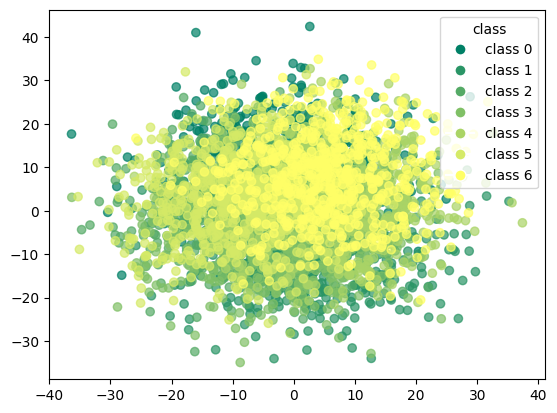

In [140]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

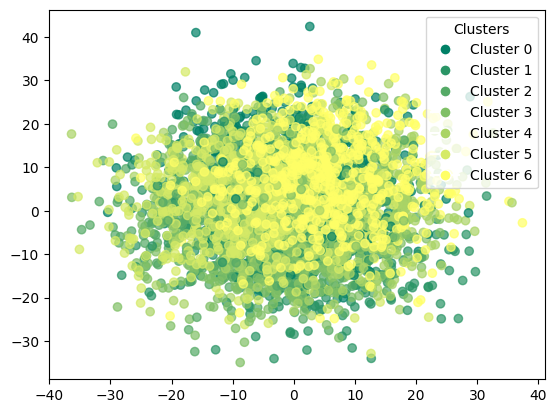

In [141]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['trim_kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_trim_kmeans['trim_kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

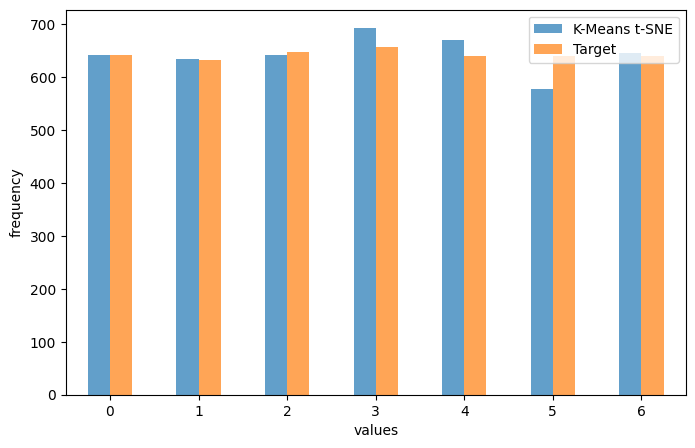

In [142]:
counts_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [143]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne']))

[[550  30   6  14  27   6   9]
 [  0 450  42  45  48  30  17]
 [ 13  45 530  14  41   4   0]
 [  4  62  12 523  20  25  11]
 [ 59  17  19  28 468   3  46]
 [  6  22  32  34  40 496  10]
 [ 10   7   0  34  25  13 551]]


In [144]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.86      0.86      0.86       642
           1       0.71      0.71      0.71       632
           2       0.83      0.82      0.82       647
           3       0.76      0.80      0.78       657
           4       0.70      0.73      0.72       640
           5       0.86      0.78      0.82       640
           6       0.86      0.86      0.86       640

    accuracy                           0.79      4498
   macro avg       0.79      0.79      0.79      4498
weighted avg       0.80      0.79      0.79      4498



### trimmed k-means with umap

In [145]:
trim_kmeans_umap,trimmmed_indices = trimmed_clustering(X_umap,n_clusters=7,trim_fraction=0.1)

In [146]:
trim_kmeans_umap

KMeans(n_clusters=7, random_state=42)

In [147]:
df_umap_trim_kmeans = corr_dataset.copy()

In [148]:
df_umap_trim_kmeans = df_umap_trim_kmeans.iloc[trimmmed_indices]

In [149]:
df_umap_trim_kmeans['trim_kmeans_umap'] = trim_kmeans_umap.labels_

In [150]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,4
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,4
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,4
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,4
5,-15.029245,4.896747,15.927018,-6.535717,-6.186367,-10.242324,4.159714,10.748647,-0.129886,-3.518675,...,4.037115,-0.801177,2.826198,-20.444492,-4.108956,-8.951271,-4.591017,9.182273,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,6
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,1
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,6
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,1


In [151]:
y_true = df_umap_trim_kmeans['target'].values  
y_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_trim_kmeans['trim_kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_trim_kmeans['trim_kmeans_umap'] == y_true))

accuracy before: 0.1462872387727879
accuracy after: 0.853268119164073


In [152]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,0
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,0
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,0
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,0
5,-15.029245,4.896747,15.927018,-6.535717,-6.186367,-10.242324,4.159714,10.748647,-0.129886,-3.518675,...,4.037115,-0.801177,2.826198,-20.444492,-4.108956,-8.951271,-4.591017,9.182273,0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,4
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,6
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,4
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,6


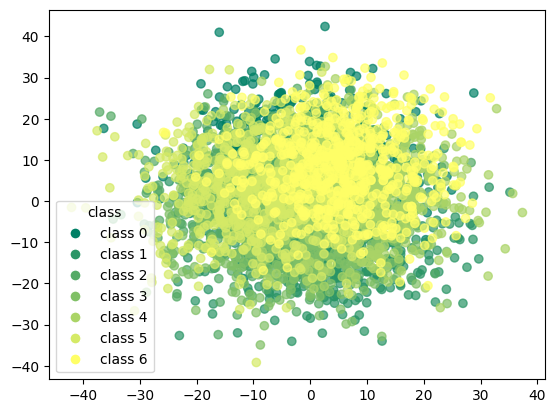

In [153]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

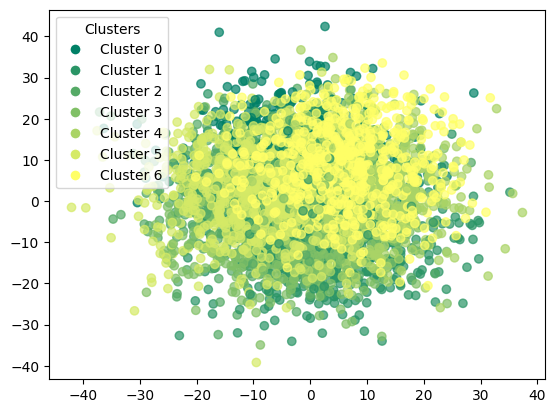

In [154]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['trim_kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_trim_kmeans['trim_kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

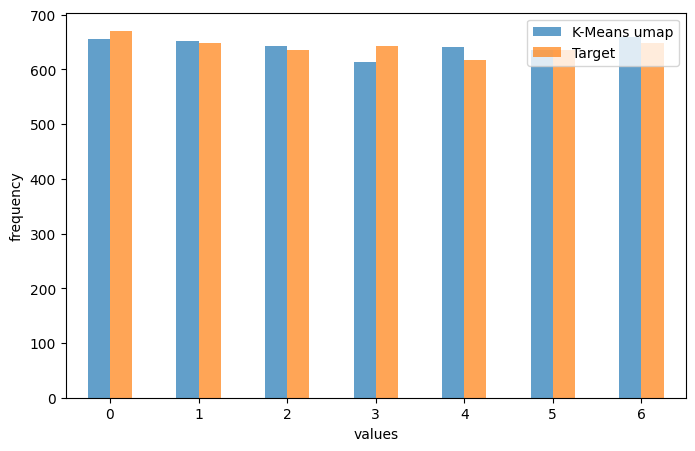

In [155]:
counts_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [156]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap']))

[[592   5   4   7  45   7  10]
 [  0 513  36  35  19  34  12]
 [ 11  20 559   6  17  17   5]
 [  5  57   9 541  14   5  12]
 [ 31  19  14   5 505   8  35]
 [ 10  20  20  10   8 555  12]
 [  6  18   1   9  33   9 573]]


In [157]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.90      0.88      0.89       670
           1       0.79      0.79      0.79       649
           2       0.87      0.88      0.87       635
           3       0.88      0.84      0.86       643
           4       0.79      0.82      0.80       617
           5       0.87      0.87      0.87       635
           6       0.87      0.88      0.88       649

    accuracy                           0.85      4498
   macro avg       0.85      0.85      0.85      4498
weighted avg       0.85      0.85      0.85      4498



## dbscan

In [158]:
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()

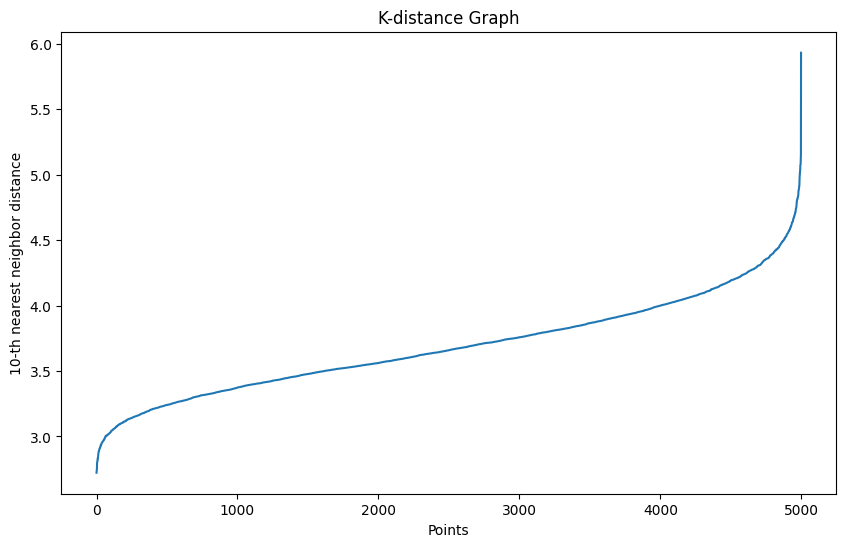

In [159]:
plot_k_distance_graph(X_values,k=10) 

In [160]:
dbscan = DBSCAN(eps=0.9,min_samples=10) # min_samples = 2*n_features

In [161]:
dbscan.fit(X_values)

DBSCAN(eps=0.9, min_samples=10)

In [162]:
df_dbscan = corr_dataset.copy()

In [163]:
df_dbscan['dbscan'] = dbscan.labels_

In [164]:
y_true = df_dbscan['target'].values  
y_kmeans = df_dbscan['dbscan'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_dbscan['dbscan'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_dbscan['dbscan'] == y_true))

accuracy before: 0.0
accuracy after: 0.0


In [165]:
df_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,-1
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,-1
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,-1
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,-1
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,-1
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,-1
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,-1
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,-1


In [166]:
print(df_dbscan['dbscan'].value_counts())

dbscan
-1    4998
Name: count, dtype: int64


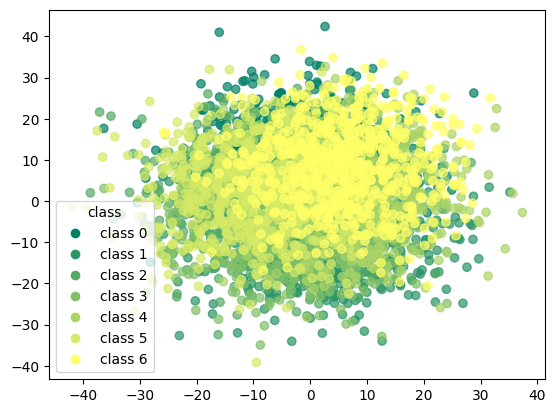

In [167]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

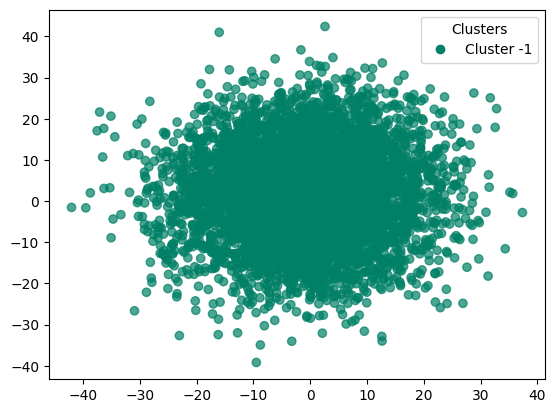

In [168]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['dbscan'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_dbscan['dbscan'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [169]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[  0   0   0   0   0   0   0   0]
 [714   0   0   0   0   0   0   0]
 [714   0   0   0   0   0   0   0]
 [714   0   0   0   0   0   0   0]
 [714   0   0   0   0   0   0   0]
 [714   0   0   0   0   0   0   0]
 [714   0   0   0   0   0   0   0]
 [714   0   0   0   0   0   0   0]]


In [170]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00     714.0
           1       0.00      0.00      0.00     714.0
           2       0.00      0.00      0.00     714.0
           3       0.00      0.00      0.00     714.0
           4       0.00      0.00      0.00     714.0
           5       0.00      0.00      0.00     714.0
           6       0.00      0.00      0.00     714.0

    accuracy                           0.00    4998.0
   macro avg       0.00      0.00      0.00    4998.0
weighted avg       0.00      0.00      0.00    4998.0



### dbscan with pca

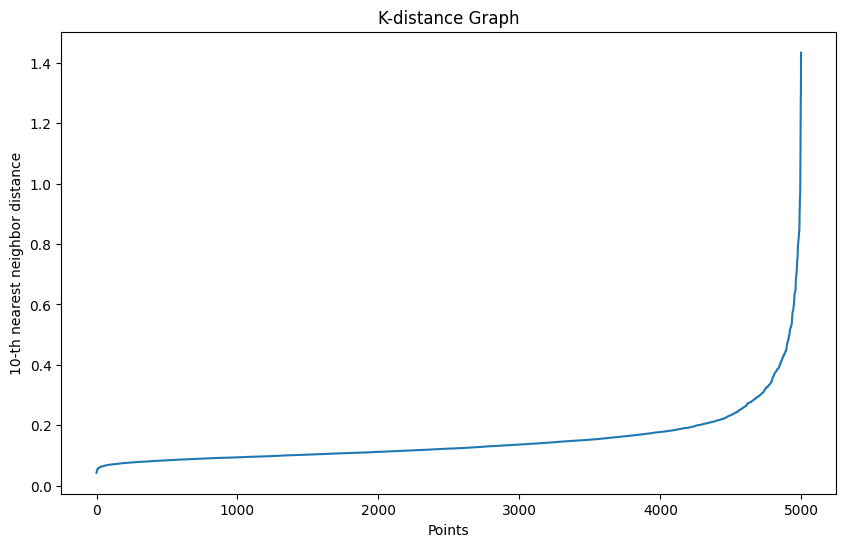

In [171]:
plot_k_distance_graph(X_pca,k=10)

In [172]:
dbscan_pca = DBSCAN(eps=0.4,min_samples=10)

In [173]:
dbscan_pca.fit(X_pca)

DBSCAN(eps=0.4, min_samples=10)

In [174]:
df_pca_dbscan = corr_dataset.copy()

In [175]:
df_pca_dbscan["dbscan_pca"] = dbscan_pca.labels_

In [176]:
y_true = df_pca_dbscan['target'].values  
y_kmeans = df_pca_dbscan['dbscan_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_dbscan['dbscan_pca'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_dbscan['dbscan_pca'] == y_true))

accuracy before: 0.13945578231292516
accuracy after: 0.0


In [177]:
df_pca_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_pca
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,7
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,7
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,7
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,7
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,7
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,7
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,7
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,7


In [178]:
print(df_pca_dbscan['dbscan_pca'].value_counts())

dbscan_pca
 7    4934
-1      64
Name: count, dtype: int64


In [179]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[  0   0   0   0   0   0   0   0   0]
 [ 17   0   0   0   0   0   0   0 697]
 [ 11   0   0   0   0   0   0   0 703]
 [ 12   0   0   0   0   0   0   0 702]
 [  0   0   0   0   0   0   0   0 714]
 [  4   0   0   0   0   0   0   0 710]
 [  2   0   0   0   0   0   0   0 712]
 [ 18   0   0   0   0   0   0   0 696]
 [  0   0   0   0   0   0   0   0   0]]


In [180]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00     714.0
           1       0.00      0.00      0.00     714.0
           2       0.00      0.00      0.00     714.0
           3       0.00      0.00      0.00     714.0
           4       0.00      0.00      0.00     714.0
           5       0.00      0.00      0.00     714.0
           6       0.00      0.00      0.00     714.0
           7       0.00      0.00      0.00       0.0

    accuracy                           0.00    4998.0
   macro avg       0.00      0.00      0.00    4998.0
weighted avg       0.00      0.00      0.00    4998.0



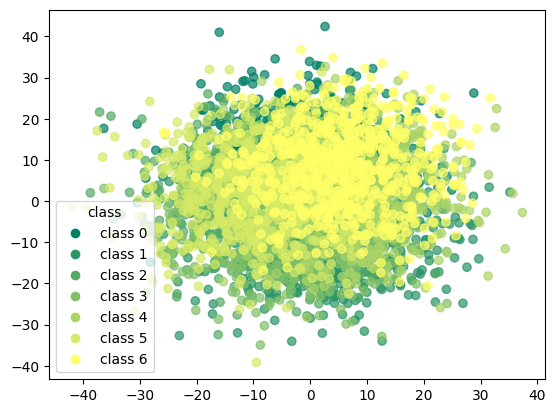

In [181]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

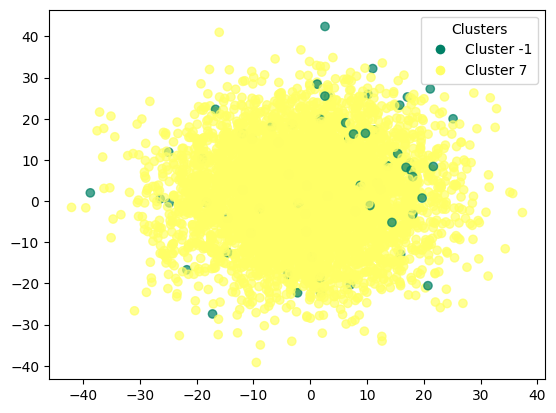

In [182]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['dbscan_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_dbscan['dbscan_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with t-SNE

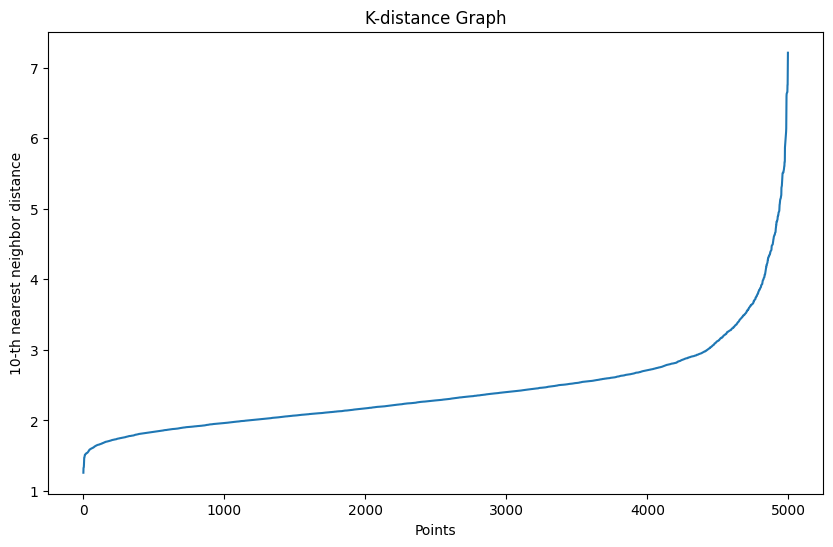

In [183]:
plot_k_distance_graph(X_tsne,k=10)

In [184]:
dbscan_tsne = DBSCAN(eps=3,min_samples=10)

In [185]:
dbscan_tsne.fit(X_tsne)

DBSCAN(eps=3, min_samples=10)

In [186]:
df_tsne_dbscan = corr_dataset.copy()

In [187]:
df_tsne_dbscan['dbscan_tsne'] = dbscan_tsne.labels_

In [188]:
y_true = df_tsne_dbscan['target'].values  
y_kmeans = df_tsne_dbscan['dbscan_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_dbscan['dbscan_tsne'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_dbscan['dbscan_tsne'] == y_true))

accuracy before: 0.1332533013205282
accuracy after: 0.14125650260104042


In [189]:
df_tsne_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_tsne
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,3
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,3
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,3
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,3
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,3
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,3
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,3
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,3


In [190]:
print(df_tsne_dbscan['dbscan_tsne'].value_counts())

dbscan_tsne
 3    4738
-1     220
 1      14
 6       9
 7       9
 4       8
Name: count, dtype: int64


In [191]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[  0   0   0   0   0   0   0   0   0]
 [ 44   0   0   0 659   5   0   1   5]
 [ 25   0   2   0 687   0   0   0   0]
 [ 45   0   0   0 667   0   0   2   0]
 [ 10   0   1   0 703   0   0   0   0]
 [ 16   0   0   0 689   1   0   6   2]
 [ 43   0   8   0 661   0   0   0   2]
 [ 37   0   3   0 672   2   0   0   0]
 [  0   0   0   0   0   0   0   0   0]]


In [192]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00       714
           1       0.14      0.00      0.01       714
           2       0.00      0.00      0.00       714
           3       0.15      0.98      0.26       714
           4       0.12      0.00      0.00       714
           5       0.00      0.00      0.00       714
           6       0.00      0.00      0.00       714
           7       0.00      0.00      0.00         0

    accuracy                           0.14      4998
   macro avg       0.05      0.11      0.03      4998
weighted avg       0.06      0.14      0.04      4998



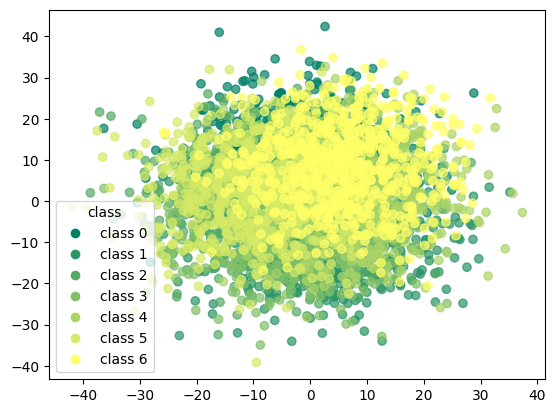

In [193]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

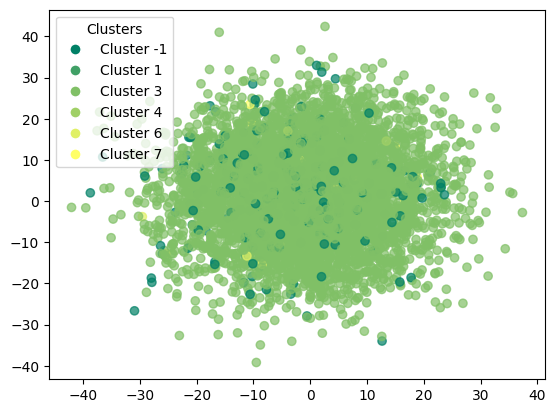

In [194]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['dbscan_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_dbscan['dbscan_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with umap

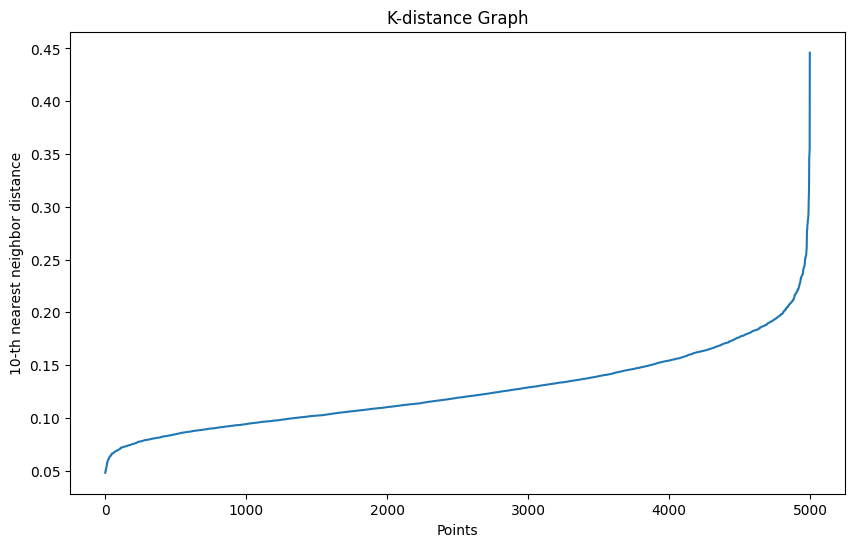

In [195]:
plot_k_distance_graph(X_umap,k=10)

In [196]:
dbscan_umap = DBSCAN(eps=0.6,min_samples=10)

In [197]:
dbscan_umap.fit(X_umap)

DBSCAN(eps=0.6, min_samples=10)

In [198]:
df_umap_dbscan = corr_dataset.copy()

In [199]:
df_umap_dbscan['dbscan_umap'] = dbscan_umap.labels_

In [200]:
y_true = df_umap_dbscan['target'].values  
y_kmeans = df_umap_dbscan['dbscan_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_dbscan['dbscan_umap'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_dbscan['dbscan_umap'] == y_true))

accuracy before: 0.14285714285714285
accuracy after: 0.14285714285714285


In [201]:
df_umap_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_umap
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,0
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,0
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,0
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,0
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,0
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,0
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,0
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,0


In [202]:
print(df_umap_dbscan['dbscan_umap'].value_counts())

dbscan_umap
0    4998
Name: count, dtype: int64


In [203]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[714   0   0   0   0   0   0]
 [714   0   0   0   0   0   0]
 [714   0   0   0   0   0   0]
 [714   0   0   0   0   0   0]
 [714   0   0   0   0   0   0]
 [714   0   0   0   0   0   0]
 [714   0   0   0   0   0   0]]


In [204]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       0.14      1.00      0.25       714
           1       0.00      0.00      0.00       714
           2       0.00      0.00      0.00       714
           3       0.00      0.00      0.00       714
           4       0.00      0.00      0.00       714
           5       0.00      0.00      0.00       714
           6       0.00      0.00      0.00       714

    accuracy                           0.14      4998
   macro avg       0.02      0.14      0.04      4998
weighted avg       0.02      0.14      0.04      4998



## GMM - Gaussian Mixture Models

In [205]:
gmm = GaussianMixture(n_components=7,init_params='k-means++',random_state=42)

In [206]:
gmm.fit(X_values)

GaussianMixture(init_params='k-means++', n_components=7, random_state=42)

In [207]:
df_gmm = corr_dataset.copy()

In [208]:
df_gmm['gmm'] = gmm.predict(X_values)

In [209]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,4
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,4
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,2
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,2
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,2
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,1
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,1
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,2


In [210]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.07102841136454582
accuracy after: 0.4733893557422969


In [211]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,0
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,0
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,6
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,6
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,6
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,4
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,4
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,6


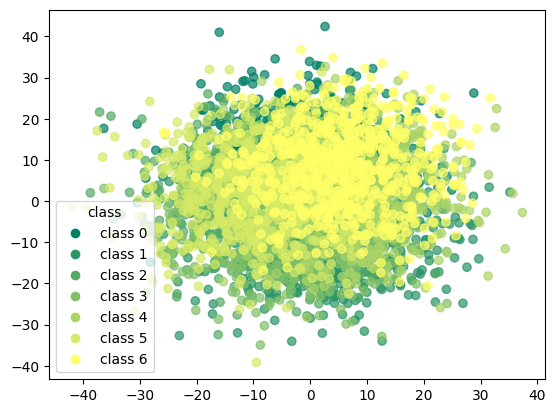

In [212]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

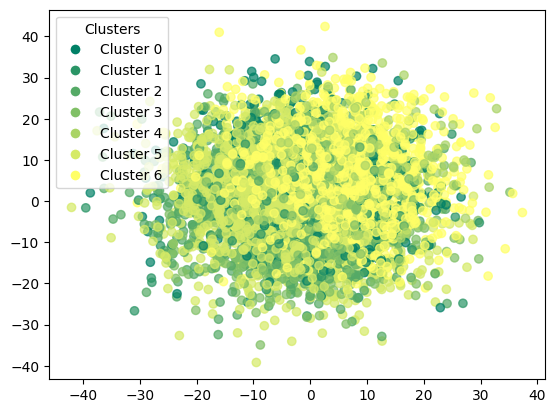

In [213]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [214]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[329   2  16  17   1   8 341]
 [ 11  46  93  91   5 453  15]
 [ 87   6 522   3   1  70  25]
 [  7   3 295 359   2  33  15]
 [189  38  25  20  39  27 376]
 [ 21  32  28  17   2 593  21]
 [  2  16  12  55 118  33 478]]


In [215]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.51      0.46      0.48       714
           1       0.32      0.06      0.11       714
           2       0.53      0.73      0.61       714
           3       0.64      0.50      0.56       714
           4       0.23      0.05      0.09       714
           5       0.49      0.83      0.61       714
           6       0.38      0.67      0.48       714

    accuracy                           0.47      4998
   macro avg       0.44      0.47      0.42      4998
weighted avg       0.44      0.47      0.42      4998



### GMM with pca

In [216]:
gmm_pca = GaussianMixture(n_components=7,init_params='k-means++',random_state=42)

In [217]:
gmm_pca.fit(X_pca)

GaussianMixture(init_params='k-means++', n_components=7, random_state=42)

In [218]:
df_pca_gmm = corr_dataset.copy()

In [219]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [220]:
df_pca_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_pca
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,2
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,3
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,2
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,2
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,3
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,1
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,3
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,1


In [221]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.07683073229291716
accuracy after: 0.49859943977591037


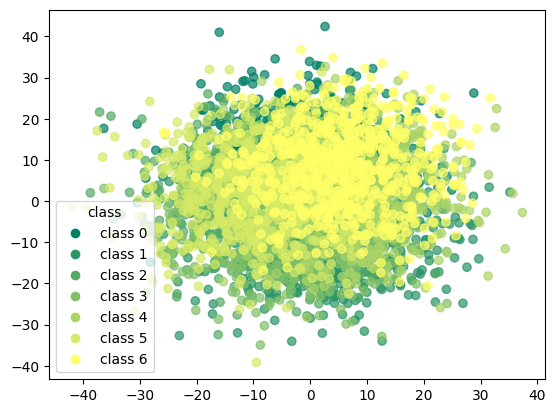

In [222]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

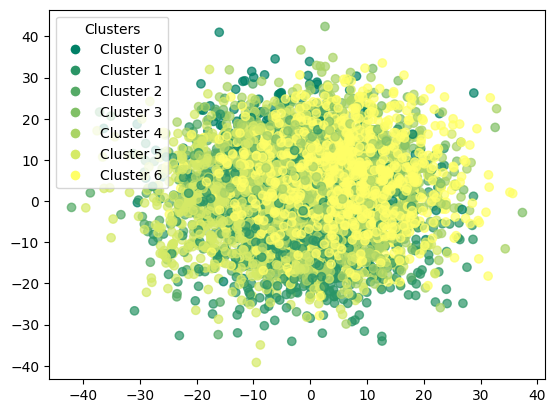

In [223]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [224]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[392   0  14  58 234  10   6]
 [  0 401   9   0  16 213  75]
 [ 11  10 290   0  63 339   1]
 [  0 197   3   0 100 232 182]
 [ 47   5   7  29 456  65 105]
 [  0 159   8   0  91 380  76]
 [  0  12   0  27  96   6 573]]


In [225]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.87      0.55      0.67       714
           1       0.51      0.56      0.54       714
           2       0.88      0.41      0.56       714
           3       0.00      0.00      0.00       714
           4       0.43      0.64      0.52       714
           5       0.31      0.53      0.39       714
           6       0.56      0.80      0.66       714

    accuracy                           0.50      4998
   macro avg       0.51      0.50      0.48      4998
weighted avg       0.51      0.50      0.48      4998



### GMM with t-SNE

In [226]:
gmm_tsne = GaussianMixture(n_components=7,init_params='k-means++',random_state=42)

In [227]:
gmm_tsne.fit(X_tsne)

GaussianMixture(init_params='k-means++', n_components=7, random_state=42)

In [228]:
df_tsne_gmm = corr_dataset.copy()

In [229]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [230]:
df_tsne_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_tsne
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,2
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,5
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,5
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,2
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,5
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,1
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,5
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,1


In [231]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.024409763905562223
accuracy after: 0.7482993197278912


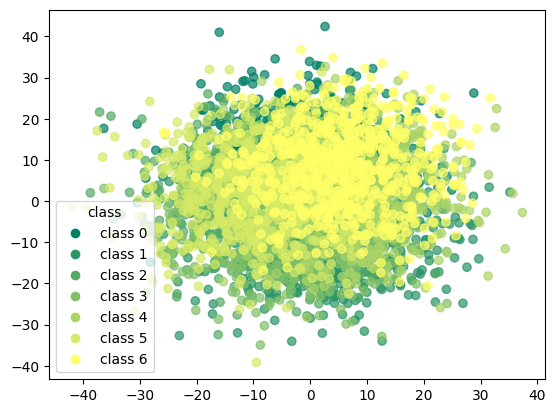

In [232]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

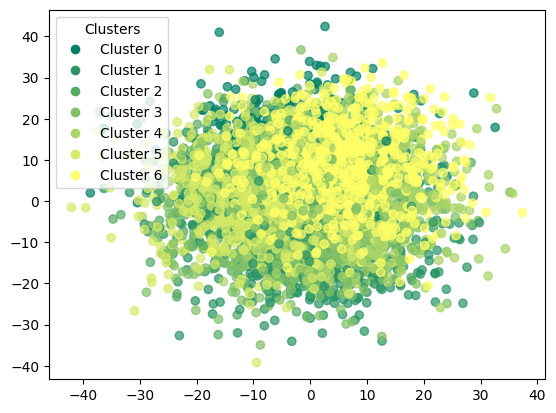

In [233]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [234]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[593  11   6  13  71   2  18]
 [  0 467  14  77  49  87  20]
 [ 15 153 443   8  85   7   3]
 [  4  73   1 576  28  23   9]
 [ 53  20  10  16 558   4  53]
 [  8  47  18  75  37 515  14]
 [ 10   8   0  56  45   7 588]]


In [235]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.87      0.83      0.85       714
           1       0.60      0.65      0.63       714
           2       0.90      0.62      0.73       714
           3       0.70      0.81      0.75       714
           4       0.64      0.78      0.70       714
           5       0.80      0.72      0.76       714
           6       0.83      0.82      0.83       714

    accuracy                           0.75      4998
   macro avg       0.76      0.75      0.75      4998
weighted avg       0.76      0.75      0.75      4998



### GMM with umap

In [236]:
gmm_umap = GaussianMixture(n_components=7,init_params='k-means++',random_state=42)

In [237]:
gmm_umap.fit(X_umap)

GaussianMixture(init_params='k-means++', n_components=7, random_state=42)

In [238]:
df_umap_gmm = corr_dataset.copy()

In [239]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [240]:
df_umap_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_umap
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,6
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,1
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,2
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,2
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,1
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,4
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,1
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,4


In [241]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.2647058823529412
accuracy after: 0.6438575430172069


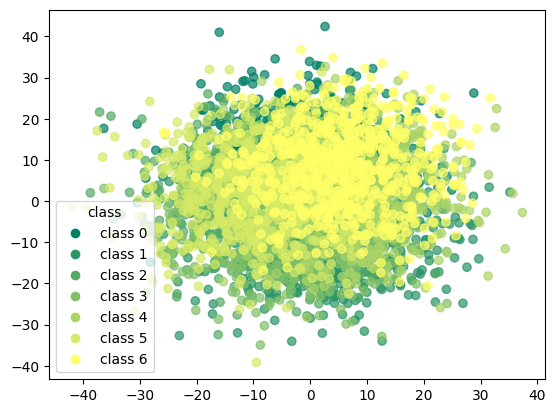

In [242]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

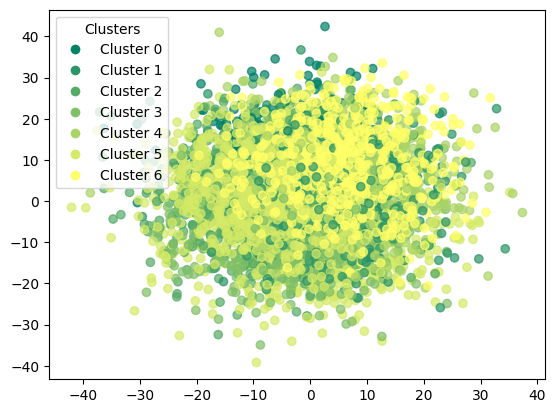

In [243]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [244]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[467  27   9   7 183  12   9]
 [  0  80  37  29   5 554   9]
 [  9  78 568   4  15  37   3]
 [  1  18   8 547  13 110  17]
 [ 10 216  14   5 414  29  26]
 [  4  29  40  14  16 604   7]
 [  2  59   1  17  48  49 538]]


In [245]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.95      0.65      0.77       714
           1       0.16      0.11      0.13       714
           2       0.84      0.80      0.82       714
           3       0.88      0.77      0.82       714
           4       0.60      0.58      0.59       714
           5       0.43      0.85      0.57       714
           6       0.88      0.75      0.81       714

    accuracy                           0.64      4998
   macro avg       0.68      0.64      0.64      4998
weighted avg       0.68      0.64      0.64      4998



## pam

In [246]:
initial_medoids = np.random.choice(len(X_values),7,replace=False)

In [247]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [248]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [249]:
pam.process()

In [250]:
clusters = pam.get_clusters()

In [251]:
medoids = pam.get_medoids()

In [252]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [253]:
df_pam = corr_dataset.copy()

In [254]:
df_pam['pam'] = labels

In [255]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,5.0
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,2.0
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,5.0
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,5.0
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,0.0
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,4.0
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,4.0
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,2.0


In [256]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.07462985194077632
accuracy after: 0.6148459383753502


In [257]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,0
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,1
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,0
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,0
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,4
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,3
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,3
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,1


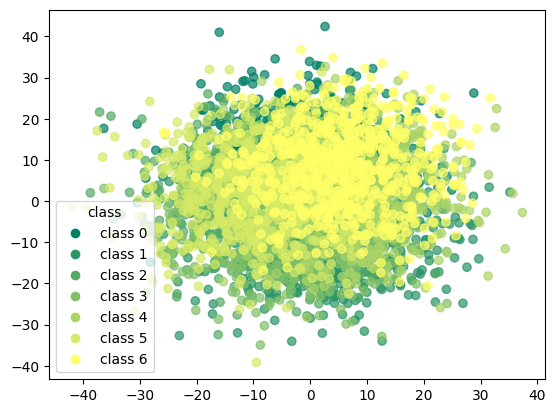

In [258]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

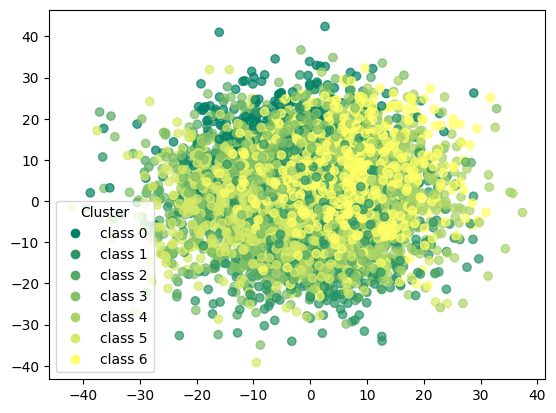

In [259]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [260]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[584  33  13  24  33  19   8]
 [  1 397  24 141  82  45  24]
 [ 14 106 396 101  20  75   2]
 [ 29 161  10 384  25  39  66]
 [ 44  24  26 106 473  23  18]
 [ 34  52  12 144  33 412  27]
 [ 16  82   5 107  73   4 427]]


In [261]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.81      0.82      0.81       714
           1       0.46      0.56      0.51       714
           2       0.81      0.55      0.66       714
           3       0.38      0.54      0.45       714
           4       0.64      0.66      0.65       714
           5       0.67      0.58      0.62       714
           6       0.75      0.60      0.66       714

    accuracy                           0.61      4998
   macro avg       0.65      0.61      0.62      4998
weighted avg       0.65      0.61      0.62      4998



### pam with pca

In [262]:
initial_medoids = np.random.choice(len(X_pca),7,replace=False)

In [263]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [264]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [265]:
pam_pca.process()

In [266]:
clusters = pam_pca.get_clusters()

In [267]:
medoids = pam_pca.get_medoids()

In [268]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [269]:
df_pam_pca = corr_dataset.copy()

In [270]:
df_pam_pca['pam_pca'] = labels

In [271]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,2.0
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,2.0
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,2.0
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,2.0
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,4.0
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,3.0
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,4.0
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,3.0


In [272]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.14285714285714285
accuracy after: 0.5624249699879952


In [273]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,0
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,0
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,0
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,0
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,4
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,6
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,4
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,6


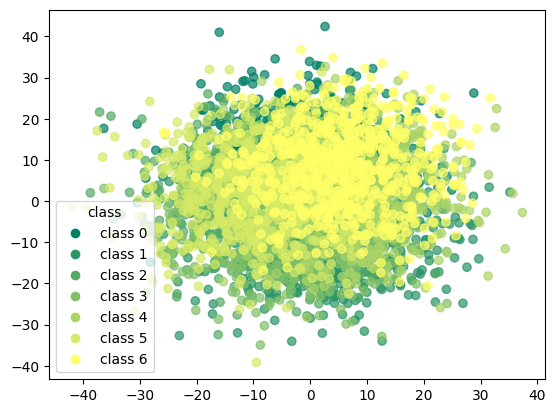

In [274]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

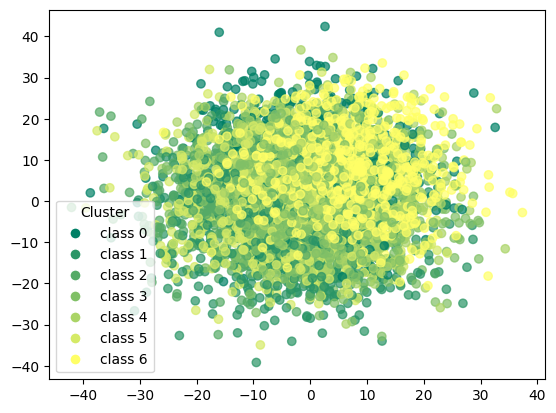

In [275]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [276]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[541   0  18   1 134   7  13]
 [  0 358  35 167  11 139   4]
 [ 19  23 539   2  29 102   0]
 [  0 128  22 267  93 173  31]
 [134   5  19  47 366  61  82]
 [  2 158  81 128  73 262  10]
 [  3   0   0 151  78   4 478]]


In [277]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.77      0.76      0.77       714
           1       0.53      0.50      0.52       714
           2       0.75      0.75      0.75       714
           3       0.35      0.37      0.36       714
           4       0.47      0.51      0.49       714
           5       0.35      0.37      0.36       714
           6       0.77      0.67      0.72       714

    accuracy                           0.56      4998
   macro avg       0.57      0.56      0.57      4998
weighted avg       0.57      0.56      0.57      4998



### pam with t-SNE

In [278]:
initial_medoids = np.random.choice(len(X_pca),7,replace=False)

In [279]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [280]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [281]:
pam_tsne.process()

In [282]:
clusters = pam_tsne.get_clusters()

In [283]:
medoids = pam_tsne.get_medoids()

In [284]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [285]:
df_pam_tsne = corr_dataset.copy()

In [286]:
df_pam_tsne['pam_tsne'] = labels

In [287]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,0.0
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,0.0
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,5.0
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,0.0
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,5.0
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,2.0
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,5.0
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,2.0


In [288]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.15106042416966786
accuracy after: 0.7775110044017607


In [289]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,0
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,0
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,4
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,0
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,4
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,6
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,4
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,6


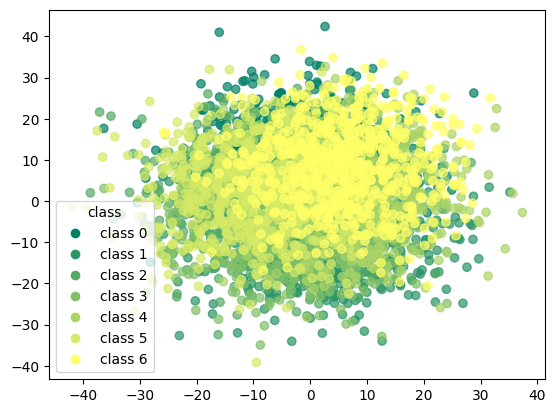

In [290]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

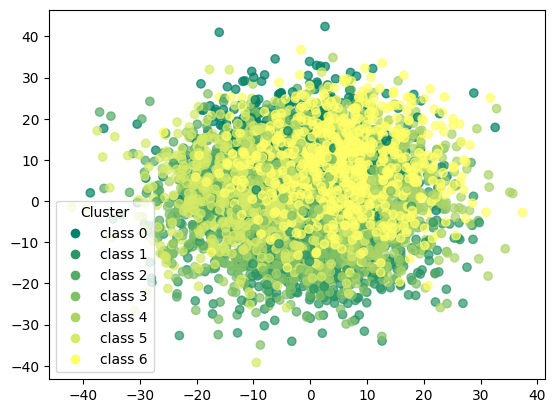

In [291]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [292]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[621   8  10  13  41   2  19]
 [  0 484  45  64  57  41  23]
 [ 18  53 570   8  56   6   3]
 [  7  66  12 569  25  20  15]
 [ 78  17  23  19 517   1  59]
 [ 10  35  35  39  47 527  21]
 [ 17   7   1  43  37  11 598]]


In [293]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.83      0.87      0.85       714
           1       0.72      0.68      0.70       714
           2       0.82      0.80      0.81       714
           3       0.75      0.80      0.77       714
           4       0.66      0.72      0.69       714
           5       0.87      0.74      0.80       714
           6       0.81      0.84      0.82       714

    accuracy                           0.78      4998
   macro avg       0.78      0.78      0.78      4998
weighted avg       0.78      0.78      0.78      4998



### pam with umap

In [294]:
initial_medoids = np.random.choice(len(X_pca),7,replace=False)

In [295]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [296]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [297]:
pam_umap.process()

In [298]:
clusters = pam_umap.get_clusters()

In [299]:
medoids = pam_umap.get_medoids()

In [300]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [301]:
df_pam_umap = corr_dataset.copy()

In [302]:
df_pam_umap['pam_umap'] = labels

In [303]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,4.0
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,6.0
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,4.0
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,4.0
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,6.0
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,0.0
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,6.0
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,0.0


In [304]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.1638655462184874
accuracy after: 0.8105242096838735


In [305]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,12.471543,11.692698,0.529687,15.157867,-2.189164,-2.090713,3.854907,3.533292,8.208771,-0.562620,...,9.855758,1.723516,-7.963298,-3.008800,-27.684499,3.755097,-14.583101,5.206514,0,0
1,5.065921,-1.208894,-1.469488,14.723178,5.820972,-3.157107,-14.407142,-11.200603,7.932367,-4.435750,...,3.621899,-4.233667,6.357067,-8.869762,-11.433554,5.854619,-3.686646,-3.128464,0,4
2,7.048264,-2.167242,9.557345,-5.336453,-11.228972,-6.362510,-10.217086,-9.538783,16.795333,15.279171,...,0.835296,-15.984842,-4.999387,-17.721673,0.936561,-6.793686,-17.634054,-39.867098,0,0
3,-3.592926,10.852487,17.352776,-14.703414,2.318145,-11.274459,-8.051599,8.418862,0.412908,-15.451289,...,17.048305,-0.292084,-6.690407,-20.402938,1.622834,0.108555,0.325557,-0.470250,0,0
4,-2.039807,4.500067,-5.498142,2.114345,8.494489,-18.425592,1.251689,15.463402,-16.017797,9.703342,...,26.306846,3.808126,-15.416288,-0.124540,-13.633110,-7.859602,0.181030,8.048742,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,1.516350,-2.070157,4.790890,13.664418,10.808925,3.319219,6.730004,10.060547,5.684657,8.147790,...,-11.592047,8.779736,-2.592770,2.276653,0.676510,25.963963,-7.351850,1.505247,6,4
4994,0.288907,12.832612,-7.647341,-15.756664,-12.580183,-5.001980,7.615081,5.055639,-6.583266,-3.617203,...,6.415260,5.098213,4.564655,-4.361331,-6.449314,5.718229,-3.753041,9.014627,6,6
4995,-2.679799,18.512893,17.298399,-17.716106,-4.664456,-4.548239,-1.201594,-2.895951,-7.722665,10.029849,...,14.103104,13.971645,5.152498,12.284871,-12.379197,2.258631,-6.314286,1.279938,6,4
4996,15.236861,20.175814,1.716160,-16.537421,18.265024,18.023486,7.977714,10.705107,3.027237,-6.935883,...,-18.065825,-18.168485,12.925081,-15.122945,5.832352,15.412019,0.485116,-8.959311,6,6


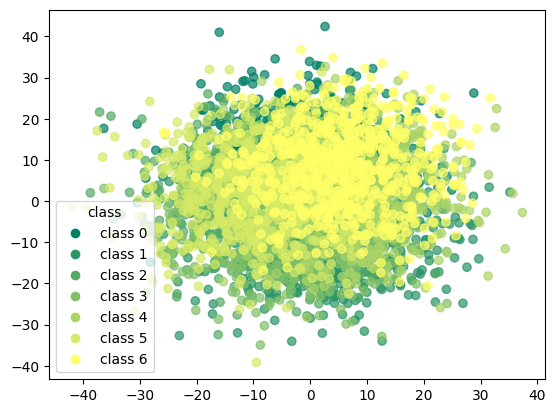

In [306]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

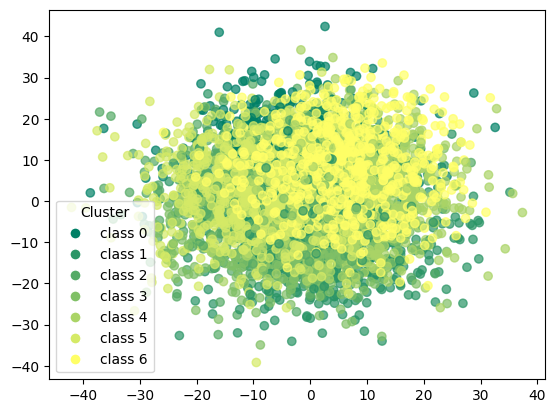

In [307]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [308]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[610   5  14   8  56   7  14]
 [  0 540  49  39  27  38  21]
 [ 17  29 599   6  34  24   5]
 [  5  74  10 576  19   9  21]
 [ 42  34  27   7 556   8  40]
 [ 16  34  34  15  17 578  20]
 [  6  32   1  18  56   9 592]]


In [309]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.88      0.85      0.87       714
           1       0.72      0.76      0.74       714
           2       0.82      0.84      0.83       714
           3       0.86      0.81      0.83       714
           4       0.73      0.78      0.75       714
           5       0.86      0.81      0.83       714
           6       0.83      0.83      0.83       714

    accuracy                           0.81      4998
   macro avg       0.81      0.81      0.81      4998
weighted avg       0.81      0.81      0.81      4998



# overall results k-means

## basic

In [310]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.88      0.91      0.89       714
           1       0.82      0.78      0.80       714
           2       0.86      0.88      0.87       714
           3       0.84      0.88      0.86       714
           4       0.83      0.81      0.82       714
           5       0.89      0.85      0.87       714
           6       0.86      0.89      0.88       714

    accuracy                           0.86      4998
   macro avg       0.86      0.86      0.85      4998
weighted avg       0.86      0.86      0.85      4998



In [311]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[647   3   7  13  26   7  11]
 [  1 555  43  47  23  25  20]
 [ 17  21 626   7  23  18   2]
 [  8  42   6 625  11   8  14]
 [ 42  19  17  15 577   6  38]
 [ 11  19  28  19  13 609  15]
 [ 11  16   3  14  24  10 636]]


## + pca

In [312]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.78      0.71      0.74       714
           1       0.40      0.39      0.40       714
           2       0.76      0.72      0.74       714
           3       0.36      0.37      0.36       714
           4       0.46      0.39      0.42       714
           5       0.26      0.37      0.30       714
           6       0.78      0.66      0.71       714

    accuracy                           0.52      4998
   macro avg       0.54      0.52      0.53      4998
weighted avg       0.54      0.52      0.53      4998



In [313]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[505   0  19   0 155  30   5]
 [  1 281  25 275   0 120  12]
 [ 21 101 515   2   7  68   0]
 [  1  96  21 266  28 258  44]
 [115  11  20  16 280 213  59]
 [  3 206  82 126  18 263  16]
 [  2   0   0  60 118  63 471]]


## + t-SNE

In [314]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.82      0.87      0.85       714
           1       0.71      0.68      0.70       714
           2       0.81      0.80      0.80       714
           3       0.74      0.77      0.76       714
           4       0.67      0.71      0.69       714
           5       0.85      0.75      0.79       714
           6       0.81      0.83      0.82       714

    accuracy                           0.77      4998
   macro avg       0.78      0.77      0.77      4998
weighted avg       0.78      0.77      0.77      4998



In [315]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[621   8  10  13  41   2  19]
 [  0 489  46  61  53  44  21]
 [ 18  58 569   7  52   7   3]
 [  7  76  12 551  25  28  15]
 [ 80  18  26  21 509   1  59]
 [ 10  34  36  40  41 532  21]
 [ 18   7   1  47  34  11 596]]


## + UMAP

In [316]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.87      0.86      0.87       714
           1       0.73      0.73      0.73       714
           2       0.81      0.84      0.83       714
           3       0.84      0.81      0.83       714
           4       0.73      0.77      0.75       714
           5       0.85      0.82      0.83       714
           6       0.83      0.83      0.83       714

    accuracy                           0.81      4998
   macro avg       0.81      0.81      0.81      4998
weighted avg       0.81      0.81      0.81      4998



In [317]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[617   5  14   8  49   7  14]
 [  0 522  49  49  26  47  21]
 [ 19  28 598   7  33  24   5]
 [  5  63  12 581  19  11  23]
 [ 47  35  26   9 549   8  40]
 [ 17  27  34  17  16 583  20]
 [  7  32   1  18  55   9 592]]


# overall results trimmed k-means

## basic

In [318]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       0.88      0.92      0.90       642
           1       0.81      0.80      0.81       632
           2       0.88      0.87      0.87       647
           3       0.87      0.87      0.87       657
           4       0.84      0.82      0.83       640
           5       0.90      0.86      0.88       640
           6       0.86      0.89      0.88       640

    accuracy                           0.86      4498
   macro avg       0.86      0.86      0.86      4498
weighted avg       0.86      0.86      0.86      4498



In [319]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[592   4   6   9  19   3   9]
 [  1 508  34  30  19  22  18]
 [ 14  21 565   4  22  19   2]
 [  7  47   5 572   7   7  12]
 [ 38  15  12  13 523   5  34]
 [  8  17  22  16  11 552  14]
 [  9  15   1  15  23   8 569]]


## + pca

In [320]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.72      0.73      0.72       642
           1       0.47      0.40      0.43       632
           2       0.71      0.55      0.62       647
           3       0.30      0.33      0.32       657
           4       0.39      0.47      0.42       640
           5       0.31      0.37      0.34       640
           6       0.72      0.64      0.68       640

    accuracy                           0.50      4498
   macro avg       0.52      0.50      0.51      4498
weighted avg       0.52      0.50      0.50      4498



In [321]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[466  24  13  20  88  16  15]
 [  0 250  50 138  20 170   4]
 [ 12  27 359  43  51 145  10]
 [ 18 104  12 219 137 133  34]
 [138   6  15  53 298  46  84]
 [  3 118  56 114 100 238  11]
 [  7   7   2 134  70  11 409]]


## + t-SNE

In [322]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.86      0.86      0.86       642
           1       0.71      0.71      0.71       632
           2       0.83      0.82      0.82       647
           3       0.76      0.80      0.78       657
           4       0.70      0.73      0.72       640
           5       0.86      0.78      0.82       640
           6       0.86      0.86      0.86       640

    accuracy                           0.79      4498
   macro avg       0.79      0.79      0.79      4498
weighted avg       0.80      0.79      0.79      4498



In [323]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

[[550  30   6  14  27   6   9]
 [  0 450  42  45  48  30  17]
 [ 13  45 530  14  41   4   0]
 [  4  62  12 523  20  25  11]
 [ 59  17  19  28 468   3  46]
 [  6  22  32  34  40 496  10]
 [ 10   7   0  34  25  13 551]]


## + UMAP

In [324]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.90      0.88      0.89       670
           1       0.79      0.79      0.79       649
           2       0.87      0.88      0.87       635
           3       0.88      0.84      0.86       643
           4       0.79      0.82      0.80       617
           5       0.87      0.87      0.87       635
           6       0.87      0.88      0.88       649

    accuracy                           0.85      4498
   macro avg       0.85      0.85      0.85      4498
weighted avg       0.85      0.85      0.85      4498



In [325]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

[[592   5   4   7  45   7  10]
 [  0 513  36  35  19  34  12]
 [ 11  20 559   6  17  17   5]
 [  5  57   9 541  14   5  12]
 [ 31  19  14   5 505   8  35]
 [ 10  20  20  10   8 555  12]
 [  6  18   1   9  33   9 573]]


# overall results dbscan

## basic

In [326]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00     714.0
           1       0.00      0.00      0.00     714.0
           2       0.00      0.00      0.00     714.0
           3       0.00      0.00      0.00     714.0
           4       0.00      0.00      0.00     714.0
           5       0.00      0.00      0.00     714.0
           6       0.00      0.00      0.00     714.0

    accuracy                           0.00    4998.0
   macro avg       0.00      0.00      0.00    4998.0
weighted avg       0.00      0.00      0.00    4998.0



In [327]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[  0   0   0   0   0   0   0   0]
 [714   0   0   0   0   0   0   0]
 [714   0   0   0   0   0   0   0]
 [714   0   0   0   0   0   0   0]
 [714   0   0   0   0   0   0   0]
 [714   0   0   0   0   0   0   0]
 [714   0   0   0   0   0   0   0]
 [714   0   0   0   0   0   0   0]]


## + pca

In [328]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00     714.0
           1       0.00      0.00      0.00     714.0
           2       0.00      0.00      0.00     714.0
           3       0.00      0.00      0.00     714.0
           4       0.00      0.00      0.00     714.0
           5       0.00      0.00      0.00     714.0
           6       0.00      0.00      0.00     714.0
           7       0.00      0.00      0.00       0.0

    accuracy                           0.00    4998.0
   macro avg       0.00      0.00      0.00    4998.0
weighted avg       0.00      0.00      0.00    4998.0



In [329]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[  0   0   0   0   0   0   0   0   0]
 [ 17   0   0   0   0   0   0   0 697]
 [ 11   0   0   0   0   0   0   0 703]
 [ 12   0   0   0   0   0   0   0 702]
 [  0   0   0   0   0   0   0   0 714]
 [  4   0   0   0   0   0   0   0 710]
 [  2   0   0   0   0   0   0   0 712]
 [ 18   0   0   0   0   0   0   0 696]
 [  0   0   0   0   0   0   0   0   0]]


## + t-SNE

In [330]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00       714
           1       0.14      0.00      0.01       714
           2       0.00      0.00      0.00       714
           3       0.15      0.98      0.26       714
           4       0.12      0.00      0.00       714
           5       0.00      0.00      0.00       714
           6       0.00      0.00      0.00       714
           7       0.00      0.00      0.00         0

    accuracy                           0.14      4998
   macro avg       0.05      0.11      0.03      4998
weighted avg       0.06      0.14      0.04      4998



In [331]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[  0   0   0   0   0   0   0   0   0]
 [ 44   0   0   0 659   5   0   1   5]
 [ 25   0   2   0 687   0   0   0   0]
 [ 45   0   0   0 667   0   0   2   0]
 [ 10   0   1   0 703   0   0   0   0]
 [ 16   0   0   0 689   1   0   6   2]
 [ 43   0   8   0 661   0   0   0   2]
 [ 37   0   3   0 672   2   0   0   0]
 [  0   0   0   0   0   0   0   0   0]]


## + UMAP

In [332]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       0.14      1.00      0.25       714
           1       0.00      0.00      0.00       714
           2       0.00      0.00      0.00       714
           3       0.00      0.00      0.00       714
           4       0.00      0.00      0.00       714
           5       0.00      0.00      0.00       714
           6       0.00      0.00      0.00       714

    accuracy                           0.14      4998
   macro avg       0.02      0.14      0.04      4998
weighted avg       0.02      0.14      0.04      4998



In [333]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[714   0   0   0   0   0   0]
 [714   0   0   0   0   0   0]
 [714   0   0   0   0   0   0]
 [714   0   0   0   0   0   0]
 [714   0   0   0   0   0   0]
 [714   0   0   0   0   0   0]
 [714   0   0   0   0   0   0]]


# overall results GMM

## basic

In [334]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.51      0.46      0.48       714
           1       0.32      0.06      0.11       714
           2       0.53      0.73      0.61       714
           3       0.64      0.50      0.56       714
           4       0.23      0.05      0.09       714
           5       0.49      0.83      0.61       714
           6       0.38      0.67      0.48       714

    accuracy                           0.47      4998
   macro avg       0.44      0.47      0.42      4998
weighted avg       0.44      0.47      0.42      4998



In [335]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[329   2  16  17   1   8 341]
 [ 11  46  93  91   5 453  15]
 [ 87   6 522   3   1  70  25]
 [  7   3 295 359   2  33  15]
 [189  38  25  20  39  27 376]
 [ 21  32  28  17   2 593  21]
 [  2  16  12  55 118  33 478]]


## + pca

In [336]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.87      0.55      0.67       714
           1       0.51      0.56      0.54       714
           2       0.88      0.41      0.56       714
           3       0.00      0.00      0.00       714
           4       0.43      0.64      0.52       714
           5       0.31      0.53      0.39       714
           6       0.56      0.80      0.66       714

    accuracy                           0.50      4998
   macro avg       0.51      0.50      0.48      4998
weighted avg       0.51      0.50      0.48      4998



In [337]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[392   0  14  58 234  10   6]
 [  0 401   9   0  16 213  75]
 [ 11  10 290   0  63 339   1]
 [  0 197   3   0 100 232 182]
 [ 47   5   7  29 456  65 105]
 [  0 159   8   0  91 380  76]
 [  0  12   0  27  96   6 573]]


## + t-SNE

In [338]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.87      0.83      0.85       714
           1       0.60      0.65      0.63       714
           2       0.90      0.62      0.73       714
           3       0.70      0.81      0.75       714
           4       0.64      0.78      0.70       714
           5       0.80      0.72      0.76       714
           6       0.83      0.82      0.83       714

    accuracy                           0.75      4998
   macro avg       0.76      0.75      0.75      4998
weighted avg       0.76      0.75      0.75      4998



In [339]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[593  11   6  13  71   2  18]
 [  0 467  14  77  49  87  20]
 [ 15 153 443   8  85   7   3]
 [  4  73   1 576  28  23   9]
 [ 53  20  10  16 558   4  53]
 [  8  47  18  75  37 515  14]
 [ 10   8   0  56  45   7 588]]


## + UMAP

In [340]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.95      0.65      0.77       714
           1       0.16      0.11      0.13       714
           2       0.84      0.80      0.82       714
           3       0.88      0.77      0.82       714
           4       0.60      0.58      0.59       714
           5       0.43      0.85      0.57       714
           6       0.88      0.75      0.81       714

    accuracy                           0.64      4998
   macro avg       0.68      0.64      0.64      4998
weighted avg       0.68      0.64      0.64      4998



In [341]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[467  27   9   7 183  12   9]
 [  0  80  37  29   5 554   9]
 [  9  78 568   4  15  37   3]
 [  1  18   8 547  13 110  17]
 [ 10 216  14   5 414  29  26]
 [  4  29  40  14  16 604   7]
 [  2  59   1  17  48  49 538]]


# overall results pam

## basic

In [342]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[584  33  13  24  33  19   8]
 [  1 397  24 141  82  45  24]
 [ 14 106 396 101  20  75   2]
 [ 29 161  10 384  25  39  66]
 [ 44  24  26 106 473  23  18]
 [ 34  52  12 144  33 412  27]
 [ 16  82   5 107  73   4 427]]


In [343]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.81      0.82      0.81       714
           1       0.46      0.56      0.51       714
           2       0.81      0.55      0.66       714
           3       0.38      0.54      0.45       714
           4       0.64      0.66      0.65       714
           5       0.67      0.58      0.62       714
           6       0.75      0.60      0.66       714

    accuracy                           0.61      4998
   macro avg       0.65      0.61      0.62      4998
weighted avg       0.65      0.61      0.62      4998



## + pca

In [344]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[541   0  18   1 134   7  13]
 [  0 358  35 167  11 139   4]
 [ 19  23 539   2  29 102   0]
 [  0 128  22 267  93 173  31]
 [134   5  19  47 366  61  82]
 [  2 158  81 128  73 262  10]
 [  3   0   0 151  78   4 478]]


In [345]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.77      0.76      0.77       714
           1       0.53      0.50      0.52       714
           2       0.75      0.75      0.75       714
           3       0.35      0.37      0.36       714
           4       0.47      0.51      0.49       714
           5       0.35      0.37      0.36       714
           6       0.77      0.67      0.72       714

    accuracy                           0.56      4998
   macro avg       0.57      0.56      0.57      4998
weighted avg       0.57      0.56      0.57      4998



## + t-SNE

In [346]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[621   8  10  13  41   2  19]
 [  0 484  45  64  57  41  23]
 [ 18  53 570   8  56   6   3]
 [  7  66  12 569  25  20  15]
 [ 78  17  23  19 517   1  59]
 [ 10  35  35  39  47 527  21]
 [ 17   7   1  43  37  11 598]]


In [347]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.83      0.87      0.85       714
           1       0.72      0.68      0.70       714
           2       0.82      0.80      0.81       714
           3       0.75      0.80      0.77       714
           4       0.66      0.72      0.69       714
           5       0.87      0.74      0.80       714
           6       0.81      0.84      0.82       714

    accuracy                           0.78      4998
   macro avg       0.78      0.78      0.78      4998
weighted avg       0.78      0.78      0.78      4998



## + umap

In [348]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[610   5  14   8  56   7  14]
 [  0 540  49  39  27  38  21]
 [ 17  29 599   6  34  24   5]
 [  5  74  10 576  19   9  21]
 [ 42  34  27   7 556   8  40]
 [ 16  34  34  15  17 578  20]
 [  6  32   1  18  56   9 592]]


In [349]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.88      0.85      0.87       714
           1       0.72      0.76      0.74       714
           2       0.82      0.84      0.83       714
           3       0.86      0.81      0.83       714
           4       0.73      0.78      0.75       714
           5       0.86      0.81      0.83       714
           6       0.83      0.83      0.83       714

    accuracy                           0.81      4998
   macro avg       0.81      0.81      0.81      4998
weighted avg       0.81      0.81      0.81      4998

